In [1]:
import os
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Cropping2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.models import Model
from skimage.metrics import structural_similarity as ssim



2025-04-10 01:03:21.957617: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-10 01:03:21.971936: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-04-10 01:03:21.988570: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-04-10 01:03:21.993743: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-10 01:03:22.006597: I tensorflow/core/platform/cpu_feature_guar

In [2]:
# Define dataset path
# data_dir = r"/kaggle/input/new-seismic1/New_seismic"
data_dir = "/home/bharath/Arindam_dissertation/New_Semismic_small"

# Get subfolders (each containing clean and noisy .npy files)
subfolders = [os.path.join(data_dir, d) for d in os.listdir(data_dir) if os.path.isdir(os.path.join(data_dir, d))]

# Function to yield slices from .npy files
def data_generator():
    for folder in subfolders:
        # Identify noisy and clean files
        noisy_file = next(f for f in os.listdir(folder) if "seismic_w_noise_vol" in f)
        clean_file = next(f for f in os.listdir(folder) if "seismicCubes_RFC_fullstack" in f)

        # Load .npy files as float32
        noisy_data = np.load(os.path.join(folder, noisy_file), allow_pickle=True).astype(np.float32)  
        clean_data = np.load(os.path.join(folder, clean_file), allow_pickle=True).astype(np.float32)

        # Normalize data
        noisy_data = (noisy_data - np.min(noisy_data)) / (np.max(noisy_data) - np.min(noisy_data))
        clean_data = (clean_data - np.min(clean_data)) / (np.max(clean_data) - np.min(clean_data))

        # Slice along y-axis (300 slices per volume)
        for i in range(noisy_data.shape[2]):
            yield np.expand_dims(noisy_data[:, :, i], axis=-1), np.expand_dims(clean_data[:, :, i], axis=-1)  

# Create a TensorFlow dataset
dataset = tf.data.Dataset.from_generator(
    data_generator,
    output_signature=(
        tf.TensorSpec(shape=(1259, 300, 1), dtype=tf.float32),  # Noisy input
        tf.TensorSpec(shape=(1259, 300, 1), dtype=tf.float32)   # Clean target
    )
)

# Shuffle and split the dataset
total_slices = 300 * len(subfolders)
train_size = int(0.8 * total_slices)
val_size = int(0.15 * total_slices)

train_dataset = dataset.take(train_size).shuffle(1000).batch(8)
val_dataset = dataset.skip(train_size).take(val_size).batch(8)
test_dataset = dataset.skip(train_size + val_size).batch(8)

# Verify dataset shapes
for noisy, clean in train_dataset.take(1):
    print("Noisy batch shape:", noisy.shape)
    print("Clean batch shape:", clean.shape)




2025-04-10 01:03:24.269170: I tensorflow/core/common_runtime/gpu/gpu_device.cc:2021] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 13021 MB memory:  -> device: 0, name: NVIDIA RTX A4000, pci bus id: 0000:17:00.0, compute capability: 8.6
2025-04-10 01:03:34.653091: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 709 of 1000


Noisy batch shape: (8, 1259, 300, 1)
Clean batch shape: (8, 1259, 300, 1)


2025-04-10 01:03:38.098127: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
2025-04-10 01:03:38.102776: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [3]:
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Concatenate, Cropping2D
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
import tensorflow as tf
from tensorflow.keras.layers import ZeroPadding2D


import tensorflow as tf

def combined_ssim_depth_weighted_mse(alpha=0.8):
    """
    Combines SSIM loss and depth-weighted MSE.
    alpha: weight for SSIM (e.g., 0.8 means 80% SSIM, 20% depth-weighted MSE)
    """
    def loss(y_true, y_pred):
        # SSIM part
        ssim_loss = 1 - tf.reduce_mean(tf.image.ssim(y_true, y_pred, max_val=1.0))
        
        # Depth-weighted MSE part
        shape = tf.shape(y_true)
        height = shape[1]
        weights = tf.linspace(1.0, 2.0, height)
        weights = tf.reshape(weights, (1, height, 1, 1))  # Broadcast shape

        mse_loss = tf.reduce_mean(tf.square(y_true - y_pred) * weights)
        
        return alpha * ssim_loss + (1 - alpha) * mse_loss
    return loss



def build_unet_autoencoder(input_shape=(1259, 300, 1)):
    input_img = Input(shape=input_shape)

    # **Encoder**
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(input_img)
    pool1 = MaxPooling2D((2, 2), padding='same')(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    pool2 = MaxPooling2D((2, 2), padding='same')(conv2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    encoded = MaxPooling2D((2, 2), padding='same')(conv3)

    # **Decoder with Skip Connections**
    up1 = UpSampling2D((2, 2))(encoded)  # (316, 76)
    deconv1 = Conv2D(256, (3, 3), activation='relu', padding='same')(up1)

    # conv3 = (315, 75) → pad to (316, 76)
    conv3_padded = ZeroPadding2D(((0, 1), (0, 1)))(conv3)
    merge1 = Concatenate()([deconv1, conv3_padded])

    up2 = UpSampling2D((2, 2))(merge1)  # (632, 152)
    deconv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(up2)

    # conv2 = (630, 150) → pad to (632, 152)
    conv2_padded = ZeroPadding2D(((0, 2), (0, 2)))(conv2)
    merge2 = Concatenate()([deconv2, conv2_padded])

    up3 = UpSampling2D((2, 2))(merge2)  # (1264, 304)
    deconv3 = Conv2D(64, (3, 3), activation='relu', padding='same')(up3)

    # conv1 = (1259, 300) → pad to (1264, 304)
    conv1_padded = ZeroPadding2D(((0, 5), (0, 4)))(conv1)
    merge3 = Concatenate()([deconv3, conv1_padded])

    # **Output Layer**
    cropped = Cropping2D(((0, 5), (0, 4)))(merge3)  # Crop bottom 5 rows, right 4 columns
    output = Conv2D(1, (3, 3), activation='sigmoid', padding='same')(cropped)




    return Model(input_img, output)

# Create and compile the autoencoder
autoencoder = build_unet_autoencoder()
autoencoder.compile(optimizer=Adam(learning_rate=0.0001),  loss=combined_ssim_depth_weighted_mse(alpha=0.84))

# Summary
autoencoder.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 1259, 300, │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 1259, 300, │        640 │ input_layer[0][0] │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 630, 150,  │          0 │ conv2d[0][0]      │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 630, 150,  │     73,856 │ max_pooling2d[0]… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 315, 75,   │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 315, 75,   │    295,168 │ max_pooling2d_1[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 158, 38,   │          0 │ conv2d_2[0][0]    │
│ (MaxPooling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 316, 76,   │          0 │ max_pooling2d_2[… │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 316, 76,   │    590,080 │ up_sampling2d[0]… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 316, 76,   │          0 │ conv2d_2[0][0]    │
│ (ZeroPadding2D)     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 316, 76,   │          0 │ conv2d_3[0][0],   │
│ (Concatenate)       │ 512)              │            │ zero_padding2d[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 632, 152,  │          0 │ concatenate[0][0] │
│ (UpSampling2D)      │ 512)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 632, 152,  │    589,952 │ up_sampling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 632, 152,  │          0 │ conv2d_1[0][0]    │
│ (ZeroPadding2D)     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate_1       │ (None, 632, 152,  │          0 │ conv2d_4[0][0],   │
│ (Concatenate)       │ 256)              │            │ zero_padding2d_1… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 1264, 304, │          0 │ concatenate_1[0]… │
│ (UpSampling2D)      │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 1264, 304, │    147,520 │ up_sampling2d_2[

 Total params: 1,698,369 (6.48 MB)

 Trainable params: 1,698,369 (6.48 MB)

 Non-trainable params: 0 (0.00 B)

In [4]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.metrics import structural_similarity as ssim

class DisplayCallback(tf.keras.callbacks.Callback):
    def on_train_begin(self, logs=None):
        self.ssim_values = []
        self.val_losses = []
        self.train_losses = []

    def on_epoch_end(self, epoch, logs=None):
        # Record losses
        self.val_losses.append(logs.get('val_loss', 0))
        self.train_losses.append(logs.get('loss', 0))

        # Calculate SSIM for validation set
        ssim_values = []
        for noisy_batch, clean_batch in val_dataset.take(1):
            denoised_imgs = self.model.predict(noisy_batch, verbose=0)
            for i in range(len(clean_batch)):
                ssim_values.append(
                    ssim(
                        clean_batch[i].numpy().squeeze(),
                        denoised_imgs[i].squeeze(),
                        data_range=1.0
                    )
                )
        self.ssim_values.append(np.mean(ssim_values))

        num_pair = 2  # Number of image pairs

        # **Ensure the following plotting is inside the method**
        fig = plt.figure(figsize=(8,10 ))
        gs = gridspec.GridSpec(3, num_pair, figure=fig, wspace=0.2)  # Define grid layout

        for i in range(num_pair):
            # Original image
            ax1 = plt.subplot(gs[0, i])
            ax1.set_title("Original")
            im1 = ax1.imshow(clean_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            ax1.axis('off')
            fig.colorbar(im1, ax=ax1, fraction=0.046, pad=0.04)  # Add colorbar

            # Noisy image
            ax2 = plt.subplot(gs[1, i])
            ax2.set_title("Noisy")
            im2 = ax2.imshow(noisy_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            ax2.axis('off')
            fig.colorbar(im2, ax=ax2, fraction=0.046, pad=0.04)  # Add colorbar

            # Denoised image
            ax3 = plt.subplot(gs[2, i])
            ax3.set_title("Denoised")
            im3 = ax3.imshow(denoised_imgs[i].squeeze(), cmap='gray', vmin=0, vmax=1)
            ax3.axis('off')
            fig.colorbar(im3, ax=ax3, fraction=0.046, pad=0.04)  # Add colorbar

        plt.suptitle(f"Epoch {epoch + 1}: SSIM = {self.ssim_values[-1]:.4f}", fontsize=14)
        plt.tight_layout()
        plt.show()

    def on_train_end(self, logs=None):
        # Plot SSIM vs. Epoch
        epochs = range(1, len(self.ssim_values) + 1)
        plt.figure(figsize=(12, 6))
        plt.plot(epochs, self.ssim_values, 'b-', label='SSIM')
        plt.xlabel('Epoch')
        plt.ylabel('SSIM Score')
        plt.title('SSIM vs Epoch')
        plt.legend()
        plt.grid(True)
        plt.show()


2025-04-10 01:03:48.313805: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 865 of 1000
2025-04-10 01:03:50.221297: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


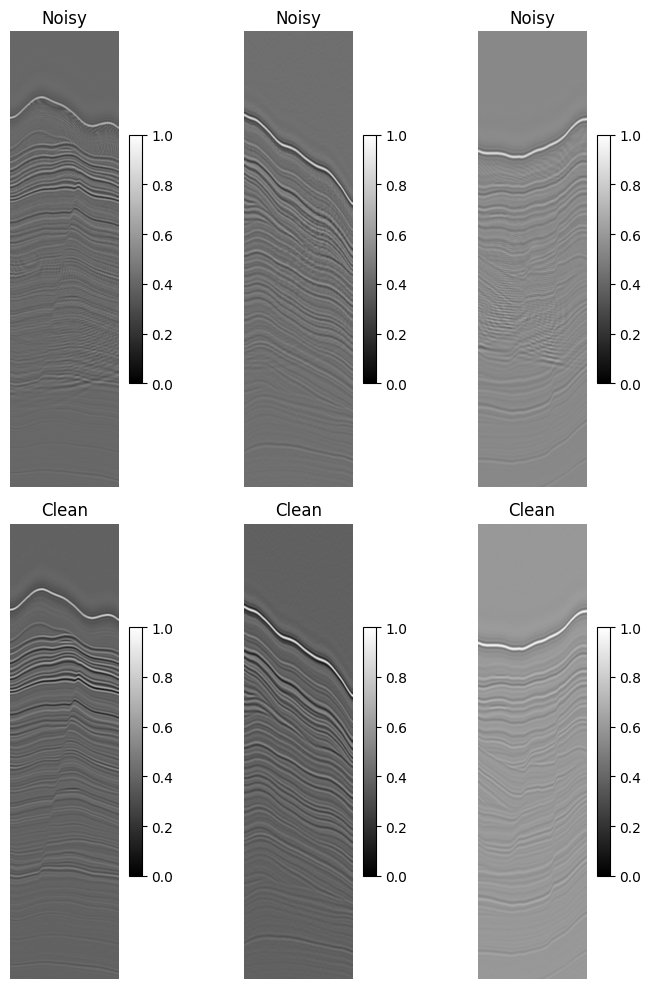

Epoch 1/70


2025-04-10 01:03:50.894111: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-10 01:04:03.015834: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 866 of 1000
2025-04-10 01:04:04.935615: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.
I0000 00:00:1744227244.942795 3494889 service.cc:146] XLA service 0x7508c4010960 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1744227244.942845 3494889 service.cc:154]   StreamExecutor device (0): NVIDIA RTX A4000, Compute Capability 8.6
2025-04-10 01:04:05.019243: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
W0000 00:00:1744227245.116173 3494889 assert_op.cc:38] Ignoring Assert operator compile_los

    120/Unknown 183s 618ms/step - loss: 0.1261

2025-04-10 01:06:54.076445: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
/home/bharath/miniconda3/envs/tf/lib/python3.12/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(value)
W0000 00:00:1744227426.326695 3494890 assert_op.cc:38] Ignoring Assert operator compile_loss/loss/SSIM/Assert/Assert
W0000 00:00:1744227426.327421 3494890 assert_op.cc:38] Ignoring Assert operator compile_loss/loss/SSIM/Assert_1/Assert
W0000 00:00:1744227426.328182 3494890 assert_op.cc:38] Ignoring Assert operator compile_loss/loss/SSIM/Assert_2/Assert
W0000 00:00:1744227426.328720 3494890 assert_op.cc:38] Ignoring Assert operator compile_loss/loss/SSIM/Assert

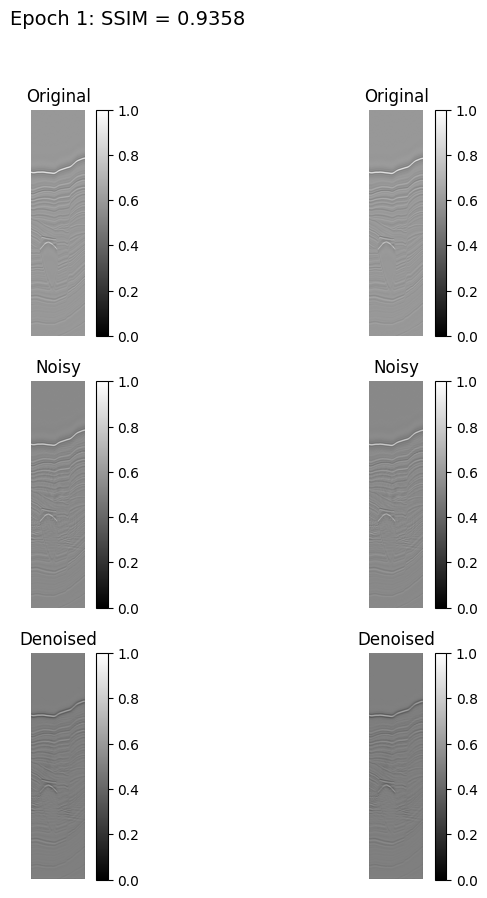

120/120 ━━━━━━━━━━━━━━━━━━━━ 230s 1s/step - loss: 0.1258 - val_loss: 0.0572
Epoch 2/70


2025-04-10 01:07:50.779070: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 866 of 1000
2025-04-10 01:07:52.680041: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 616ms/step - loss: 0.0667

2025-04-10 01:09:06.553979: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2025-04-10 01:09:06.554067: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:09:06.554109: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


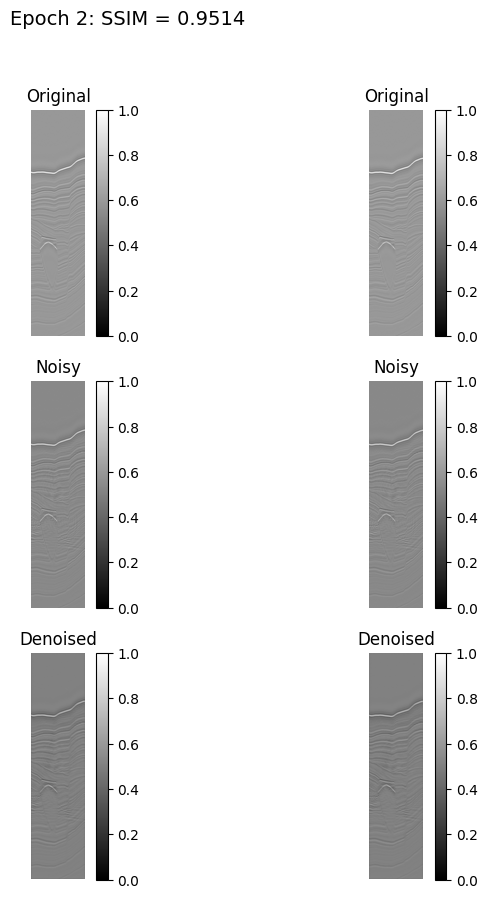

120/120 ━━━━━━━━━━━━━━━━━━━━ 115s 862ms/step - loss: 0.0667 - val_loss: 0.0471
Epoch 3/70


2025-04-10 01:09:45.895861: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 864 of 1000
2025-04-10 01:09:47.854378: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 623ms/step - loss: 0.0497

2025-04-10 01:11:18.895501: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-10 01:11:18.895559: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:11:18.895591: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


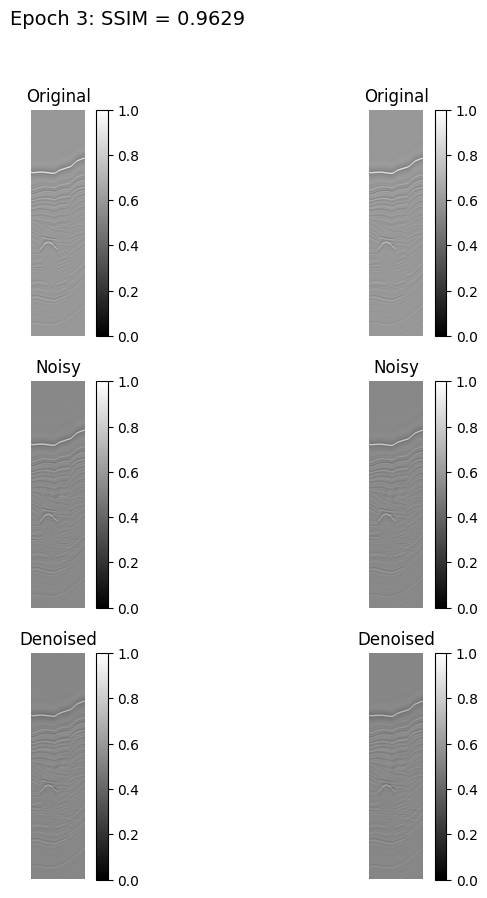

120/120 ━━━━━━━━━━━━━━━━━━━━ 116s 866ms/step - loss: 0.0497 - val_loss: 0.0325
Epoch 4/70


2025-04-10 01:11:42.723317: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 901 of 1000
2025-04-10 01:11:43.152574: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - loss: 0.0428

2025-04-10 01:13:16.912695: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:13:16.912766: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


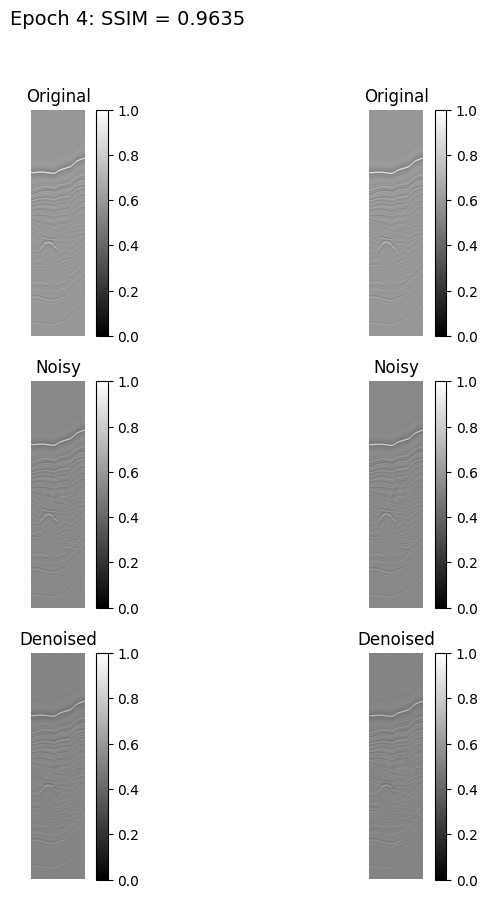

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0428 - val_loss: 0.0310
Epoch 5/70


2025-04-10 01:13:39.595029: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 893 of 1000
2025-04-10 01:13:41.298305: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 650ms/step - loss: 0.0370

2025-04-10 01:14:59.299546: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:15:15.437507: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:15:15.437583: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


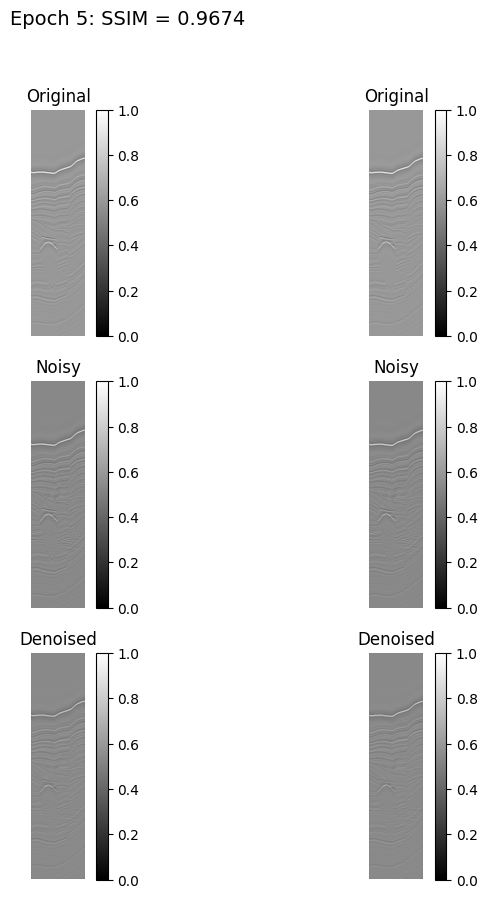

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 894ms/step - loss: 0.0370 - val_loss: 0.0268
Epoch 6/70


2025-04-10 01:15:38.324910: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-10 01:15:40.083327: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0340

2025-04-10 01:16:57.235243: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:16:57.235322: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:17:13.469104: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:17:13.469179: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:17:25.668355: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


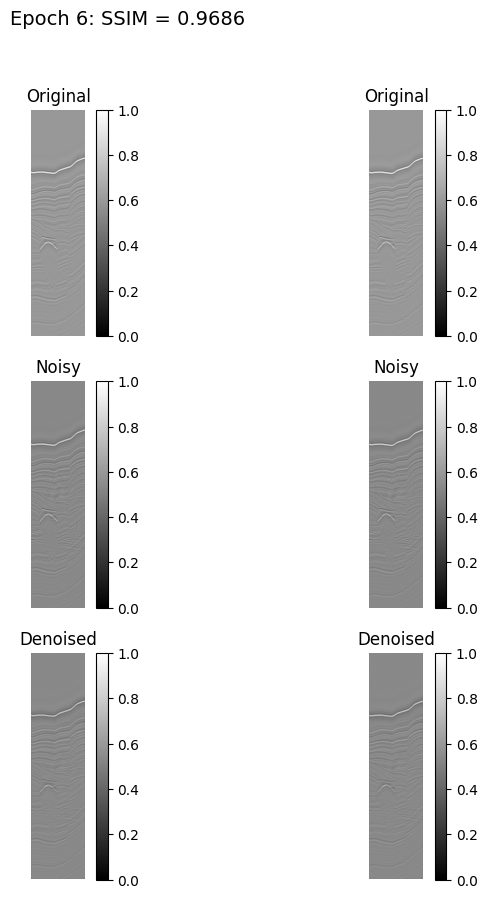

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 886ms/step - loss: 0.0340 - val_loss: 0.0264
Epoch 7/70


2025-04-10 01:17:36.176257: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-10 01:17:37.991962: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0317

2025-04-10 01:18:55.563261: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:18:55.563338: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:19:11.760398: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:19:11.760475: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


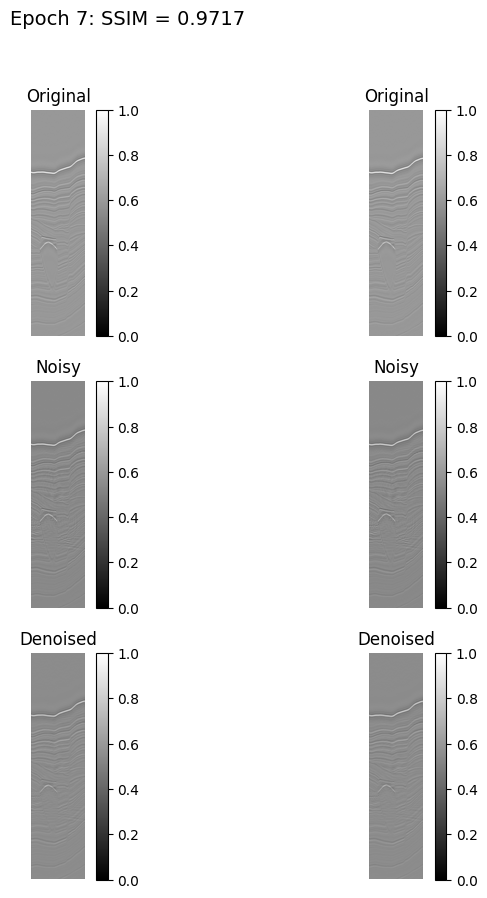

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0317 - val_loss: 0.0237
Epoch 8/70


2025-04-10 01:19:34.382852: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 898 of 1000
2025-04-10 01:19:36.034998: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 659ms/step - loss: 0.0295

2025-04-10 01:21:11.623340: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:21:11.623423: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


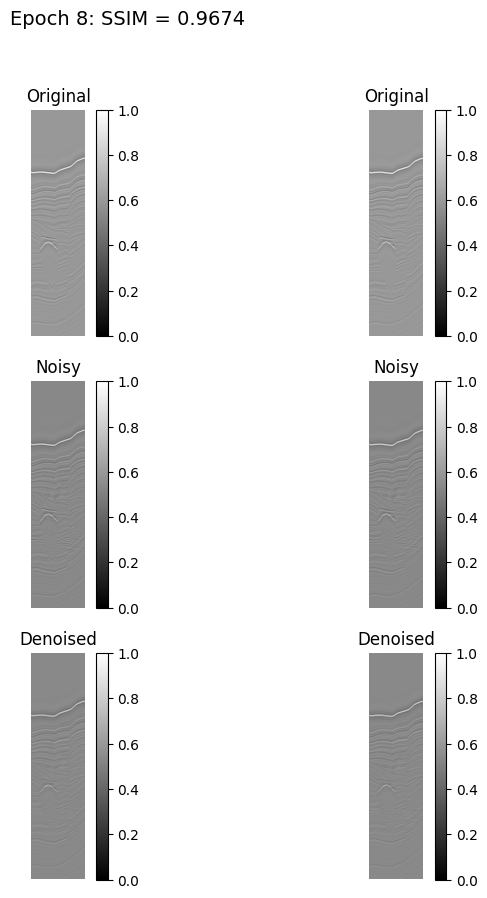

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 905ms/step - loss: 0.0295 - val_loss: 0.0275
Epoch 9/70


2025-04-10 01:21:34.327014: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 883 of 1000
2025-04-10 01:21:36.095342: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0289

2025-04-10 01:23:09.387246: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:23:09.387324: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


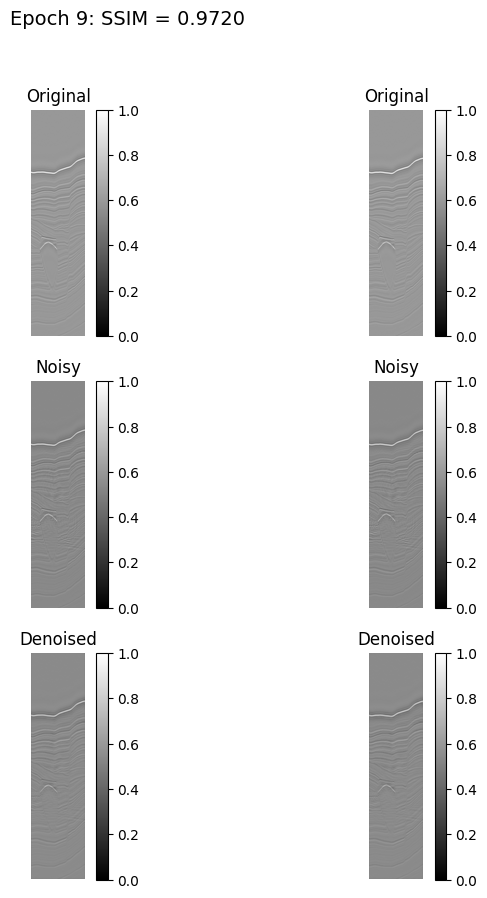

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0289 - val_loss: 0.0240
Epoch 10/70


2025-04-10 01:23:32.384750: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 882 of 1000
2025-04-10 01:23:34.167177: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0266

2025-04-10 01:24:51.261130: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:25:07.574072: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:25:07.574145: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


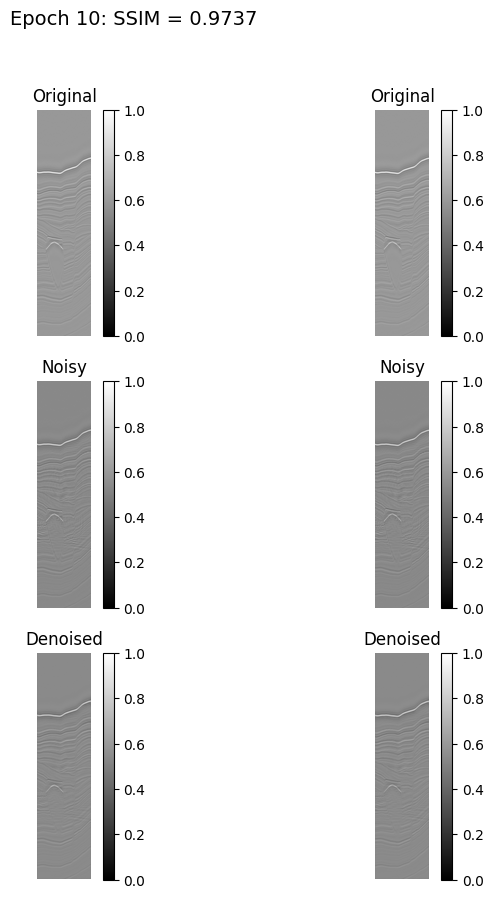

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 885ms/step - loss: 0.0266 - val_loss: 0.0231
Epoch 11/70


2025-04-10 01:25:30.111367: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 887 of 1000
2025-04-10 01:25:31.840982: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0260

2025-04-10 01:26:49.484365: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:27:05.818103: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:27:05.818175: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


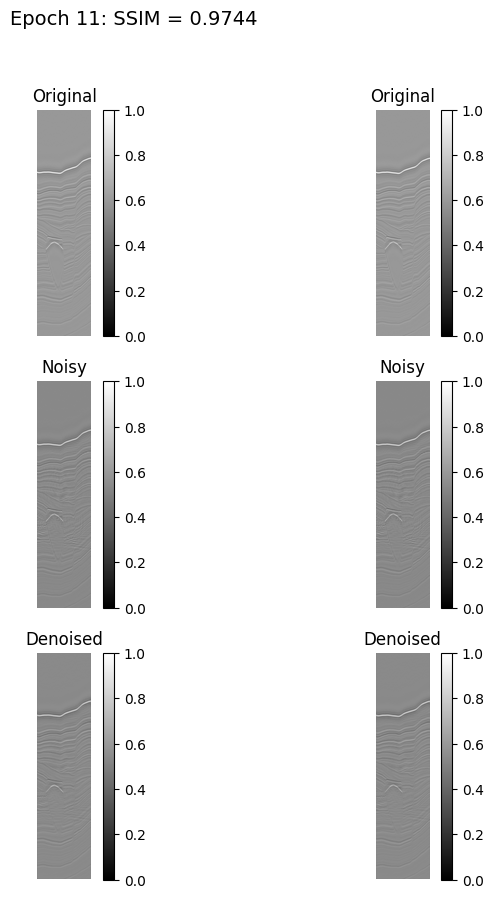

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 891ms/step - loss: 0.0260 - val_loss: 0.0230
Epoch 12/70


2025-04-10 01:27:28.565016: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-10 01:27:30.298603: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 659ms/step - loss: 0.0243

2025-04-10 01:28:49.407915: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:29:05.707937: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:29:05.708010: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


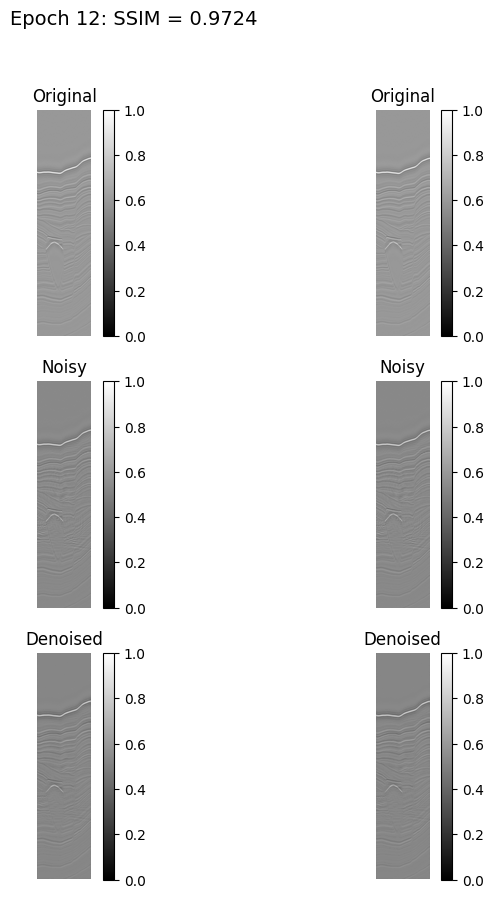

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 903ms/step - loss: 0.0243 - val_loss: 0.0252
Epoch 13/70


2025-04-10 01:29:28.363589: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 879 of 1000
2025-04-10 01:29:30.176713: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0236

2025-04-10 01:30:47.590708: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-10 01:30:47.590768: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:30:47.590804: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:31:03.714914: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:31:03.714991: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


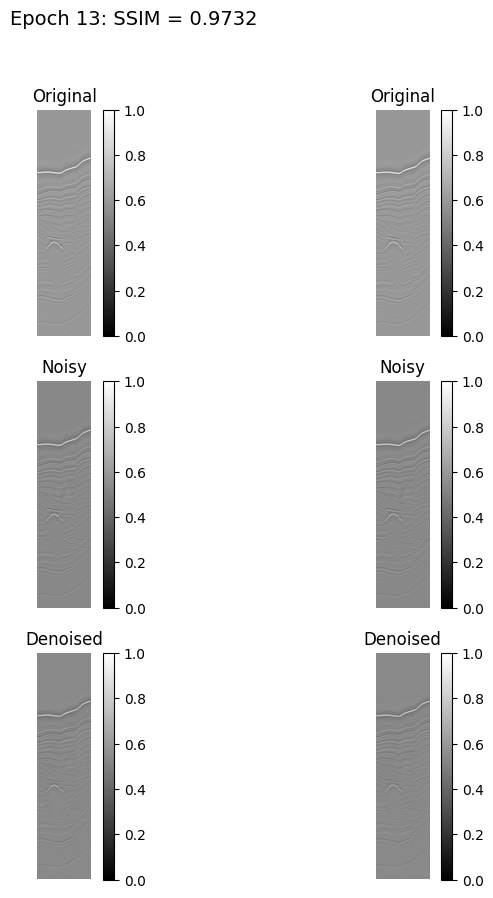

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0236 - val_loss: 0.0237
Epoch 14/70


2025-04-10 01:31:26.649285: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 890 of 1000
2025-04-10 01:31:28.371139: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - loss: 0.0226

2025-04-10 01:32:45.593015: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:33:01.929035: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:33:01.929113: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


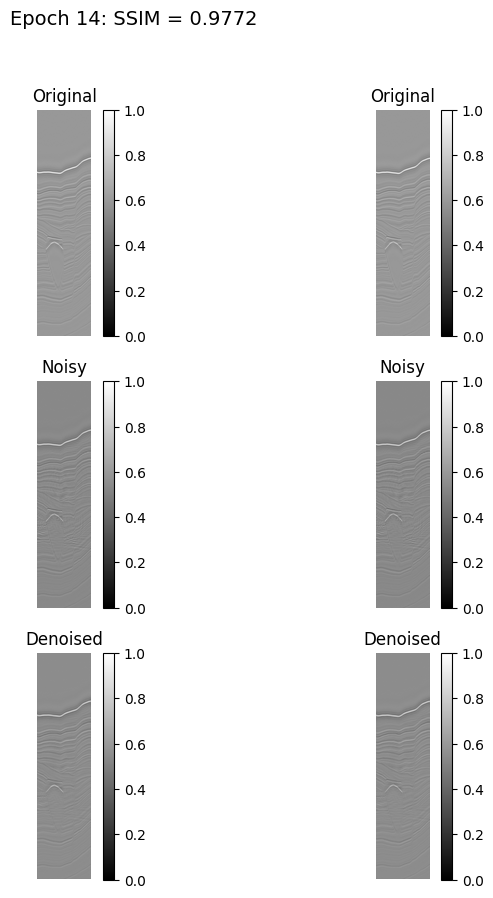

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0226 - val_loss: 0.0204
Epoch 15/70


2025-04-10 01:33:24.518057: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 888 of 1000
2025-04-10 01:33:26.246277: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 656ms/step - loss: 0.0219

2025-04-10 01:34:44.939241: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:35:01.139629: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:35:01.139694: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


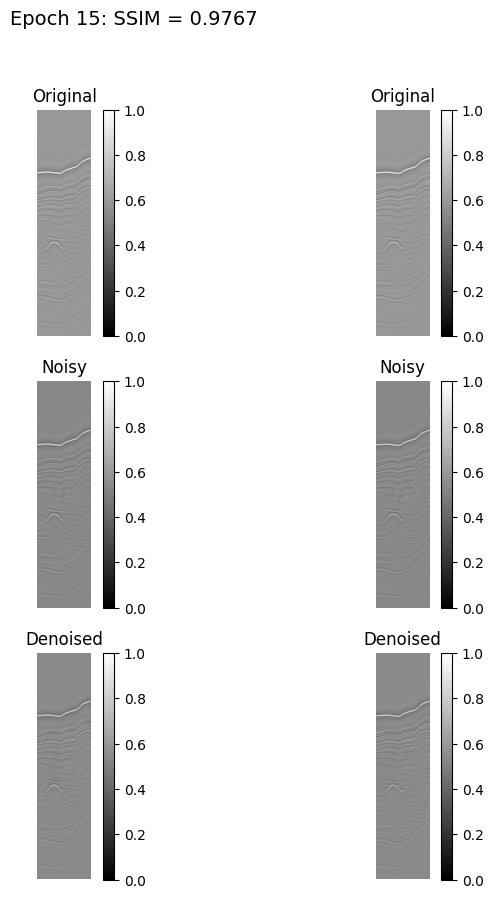

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 898ms/step - loss: 0.0219 - val_loss: 0.0216
Epoch 16/70


2025-04-10 01:35:23.789488: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 892 of 1000
2025-04-10 01:35:25.496241: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 650ms/step - loss: 0.0230

2025-04-10 01:36:59.847336: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:36:59.847414: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


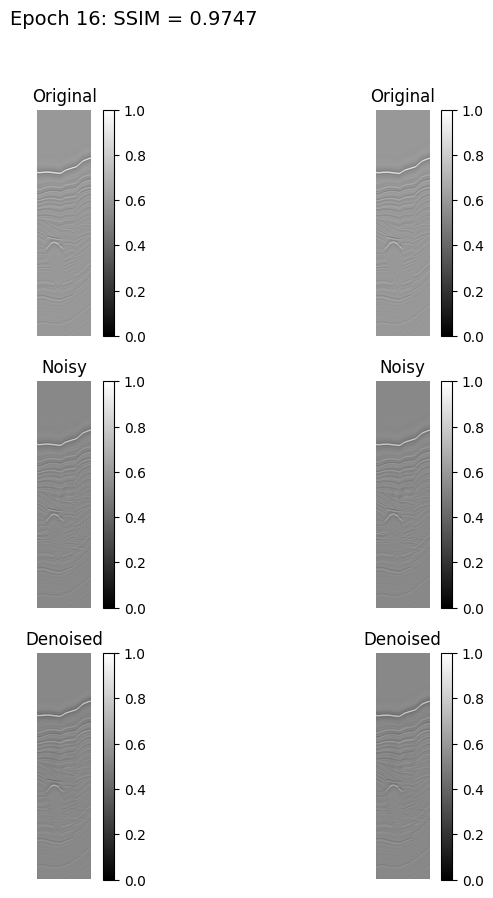

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 894ms/step - loss: 0.0230 - val_loss: 0.0236
Epoch 17/70


2025-04-10 01:37:22.489847: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-10 01:37:24.214925: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - loss: 0.0201

2025-04-10 01:38:42.572109: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:38:42.572190: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:38:58.887946: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:38:58.888018: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


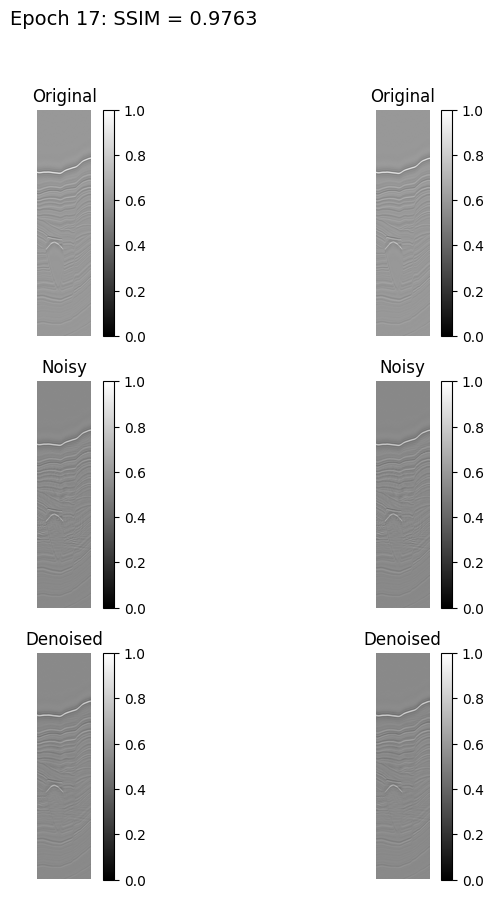

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 899ms/step - loss: 0.0201 - val_loss: 0.0218
Epoch 18/70


2025-04-10 01:39:21.809214: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 885 of 1000
2025-04-10 01:39:23.538396: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0202

2025-04-10 01:40:56.785052: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:40:56.785127: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


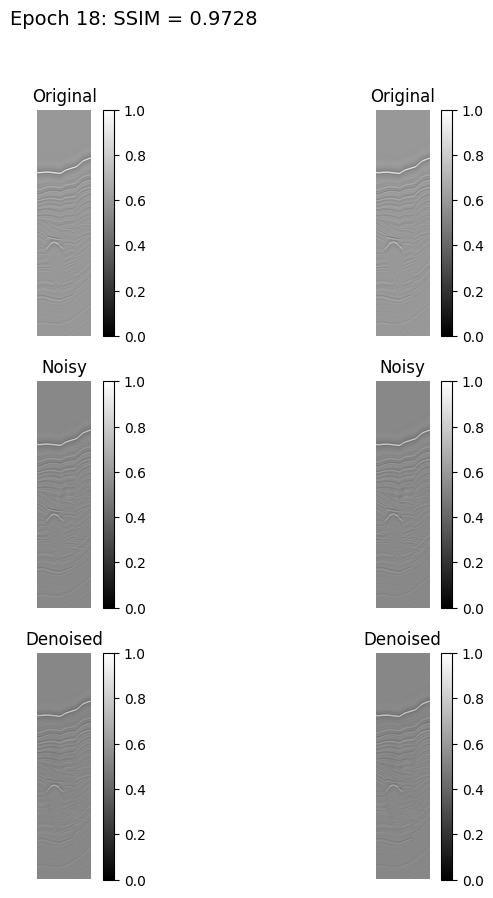

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 884ms/step - loss: 0.0202 - val_loss: 0.0247
Epoch 19/70


2025-04-10 01:41:19.425794: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 892 of 1000
2025-04-10 01:41:21.123692: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 655ms/step - loss: 0.0192

2025-04-10 01:42:39.691368: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:42:39.691448: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:42:56.083086: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:42:56.083157: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


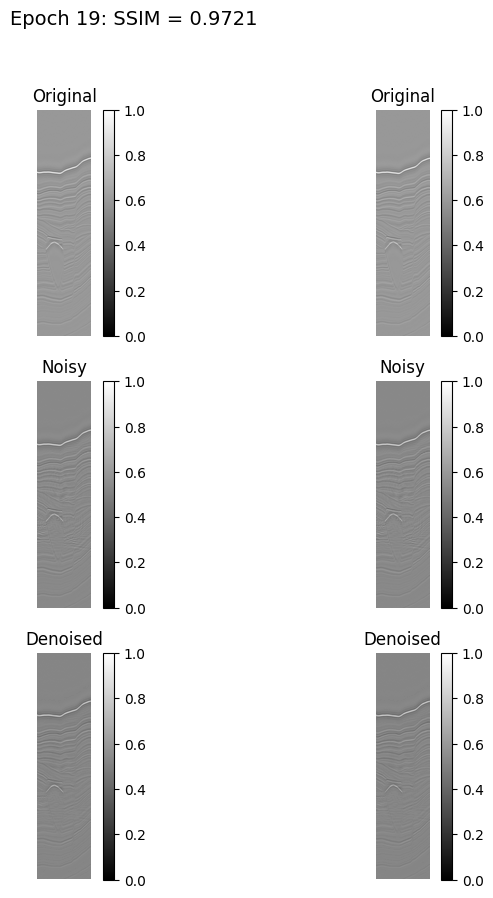

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 899ms/step - loss: 0.0192 - val_loss: 0.0256
Epoch 20/70


2025-04-10 01:43:18.800636: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 890 of 1000
2025-04-10 01:43:20.533588: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 648ms/step - loss: 0.0190

2025-04-10 01:44:54.568229: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:44:54.568299: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


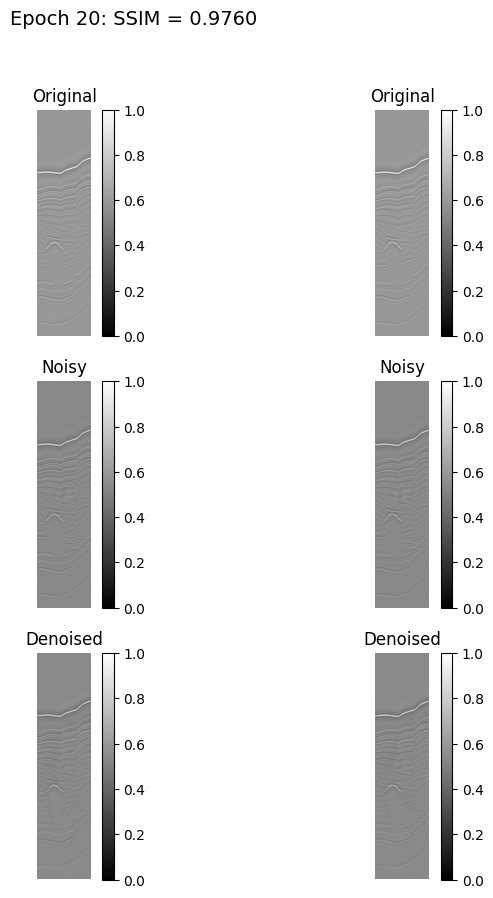

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 891ms/step - loss: 0.0190 - val_loss: 0.0221
Epoch 21/70


2025-04-10 01:45:17.181228: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 874 of 1000
2025-04-10 01:45:19.009223: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 648ms/step - loss: 0.0186

2025-04-10 01:46:36.719423: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:46:52.933777: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:46:52.933866: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


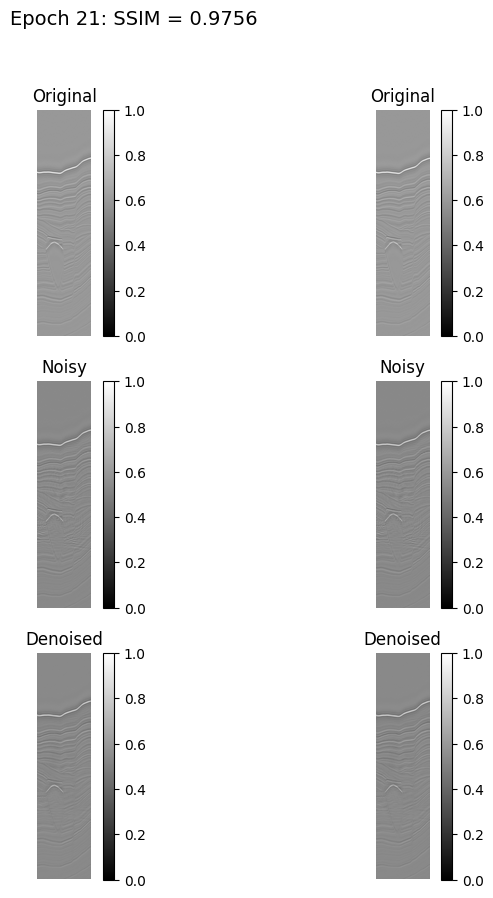

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 893ms/step - loss: 0.0186 - val_loss: 0.0226
Epoch 22/70


2025-04-10 01:47:17.047713: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 901 of 1000
2025-04-10 01:47:17.483514: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 655ms/step - loss: 0.0179

2025-04-10 01:48:52.390921: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:48:52.390994: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


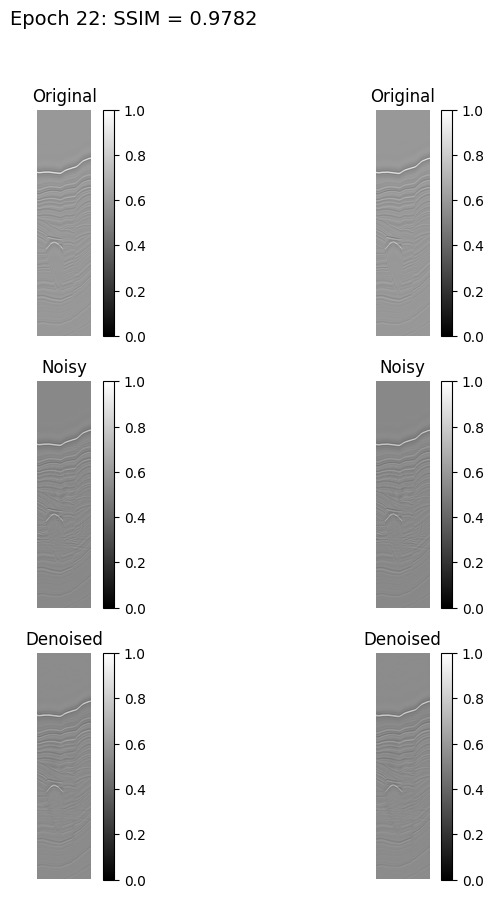

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 898ms/step - loss: 0.0179 - val_loss: 0.0203
Epoch 23/70


2025-04-10 01:49:16.158570: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 901 of 1000
2025-04-10 01:49:16.585894: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0174

2025-04-10 01:50:49.640582: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:50:49.640649: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


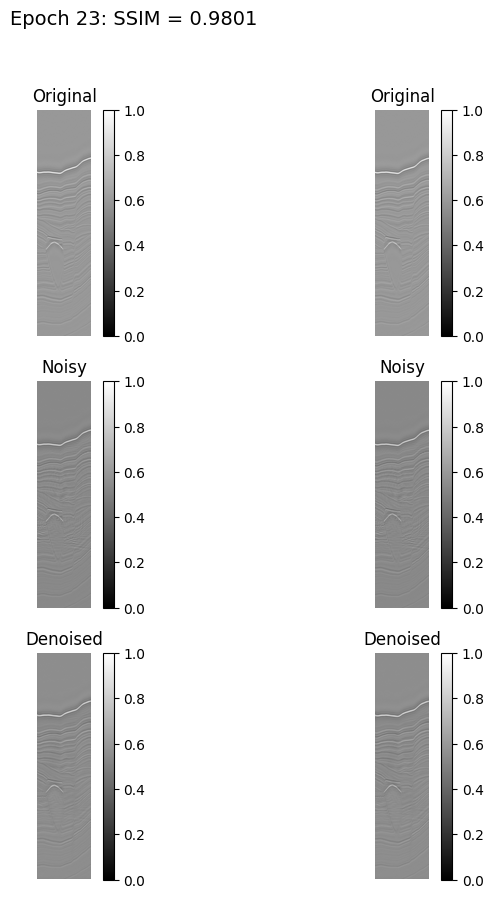

120/120 ━━━━━━━━━━━━━━━━━━━━ 117s 883ms/step - loss: 0.0174 - val_loss: 0.0188
Epoch 24/70


2025-04-10 01:51:12.243351: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 887 of 1000
2025-04-10 01:51:13.974611: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 656ms/step - loss: 0.0169

2025-04-10 01:52:32.642108: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:52:32.642202: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 01:52:48.841693: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:52:48.841765: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


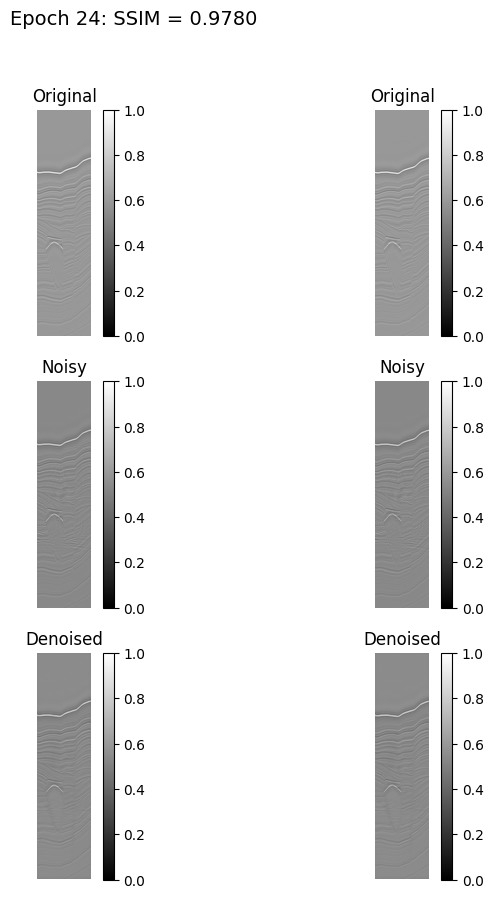

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 898ms/step - loss: 0.0169 - val_loss: 0.0206
Epoch 25/70


2025-04-10 01:53:12.615258: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 901 of 1000
2025-04-10 01:53:13.045200: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - loss: 0.0172

2025-04-10 01:54:47.189541: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:54:47.189611: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


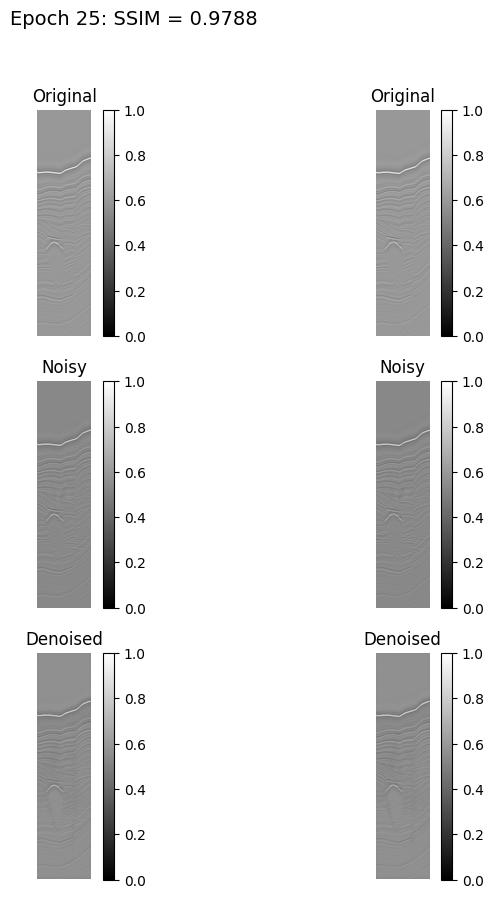

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 893ms/step - loss: 0.0172 - val_loss: 0.0194
Epoch 26/70


2025-04-10 01:55:09.997884: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-10 01:55:11.802728: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 655ms/step - loss: 0.0162

2025-04-10 01:56:30.390830: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
2025-04-10 01:56:46.687795: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:56:46.687915: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


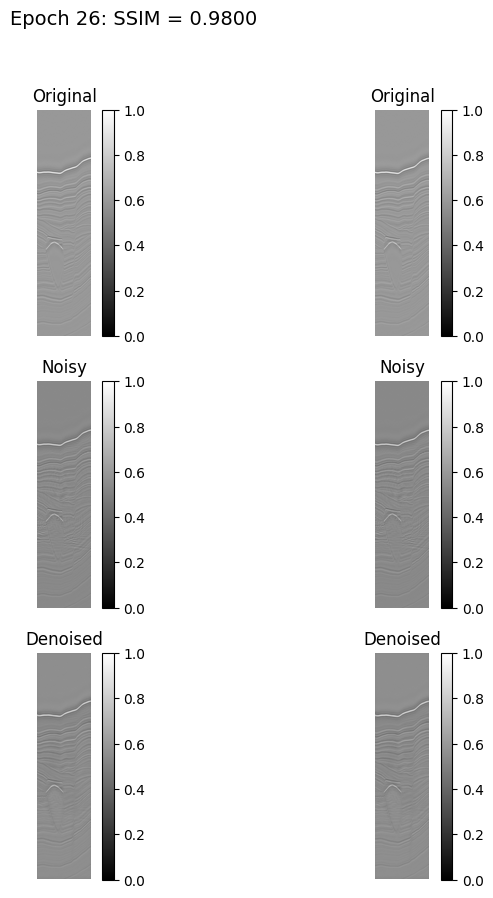

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 899ms/step - loss: 0.0162 - val_loss: 0.0188
Epoch 27/70


2025-04-10 01:57:09.374292: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 883 of 1000
2025-04-10 01:57:11.133788: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0157

2025-04-10 01:58:44.517444: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 01:58:44.517483: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


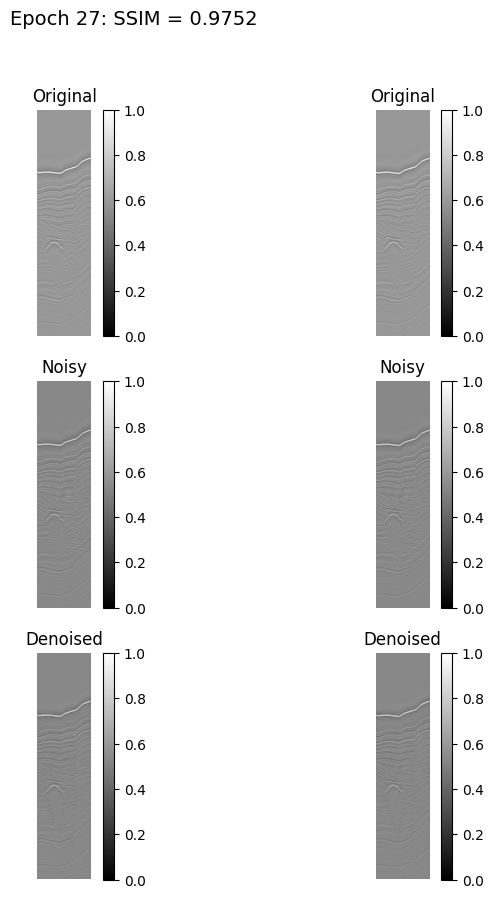

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 886ms/step - loss: 0.0157 - val_loss: 0.0225
Epoch 28/70


2025-04-10 01:59:07.231184: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 897 of 1000
2025-04-10 01:59:08.874753: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 650ms/step - loss: 0.0154

2025-04-10 02:00:43.074854: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


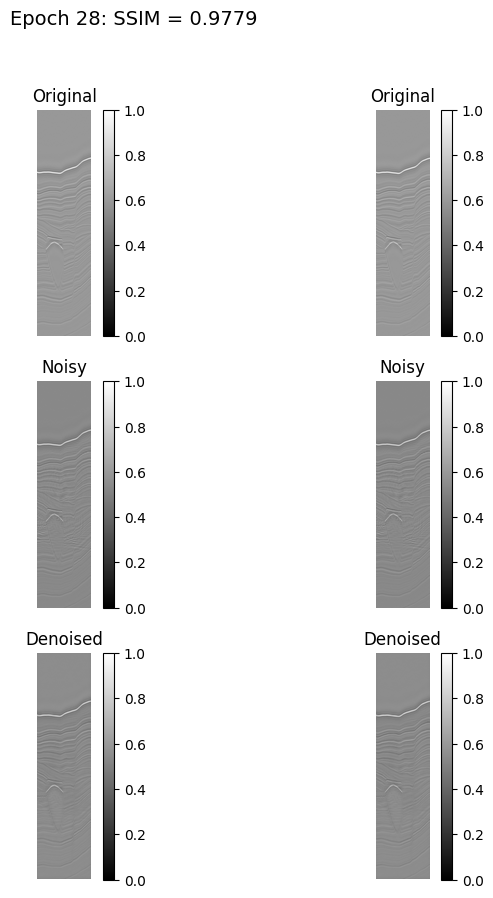

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 893ms/step - loss: 0.0155 - val_loss: 0.0204
Epoch 29/70


2025-04-10 02:01:05.780644: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 894 of 1000
2025-04-10 02:01:07.457594: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 657ms/step - loss: 0.0157

2025-04-10 02:02:42.753603: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:02:42.753682: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


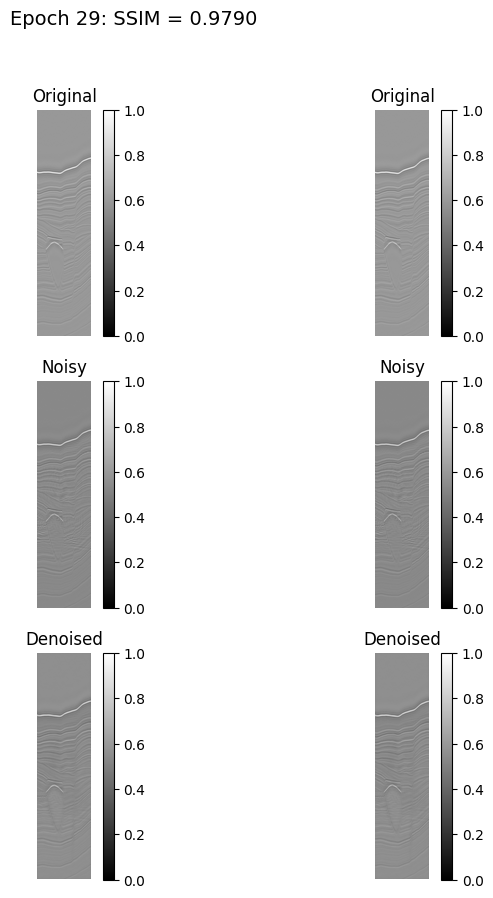

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 903ms/step - loss: 0.0157 - val_loss: 0.0190
Epoch 30/70


2025-04-10 02:03:05.495064: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-10 02:03:07.318377: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - loss: 0.0149

2025-04-10 02:04:41.442121: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:04:41.442161: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


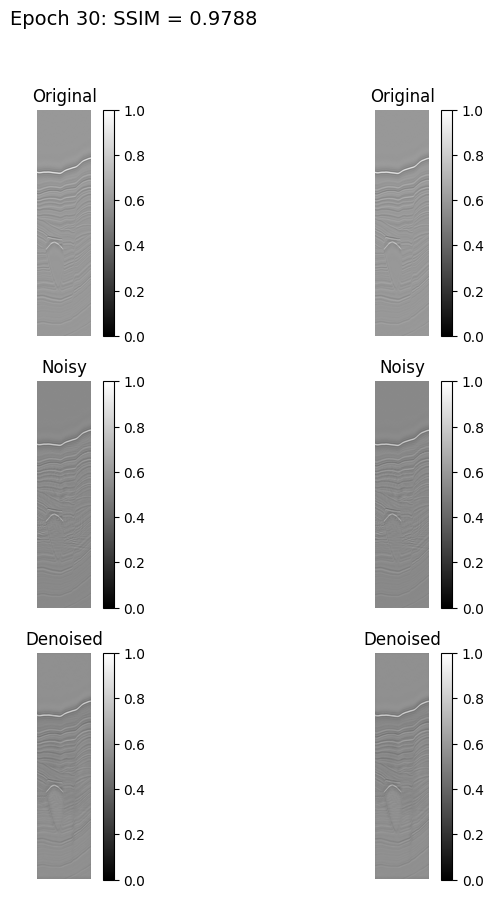

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 892ms/step - loss: 0.0149 - val_loss: 0.0194
Epoch 31/70


2025-04-10 02:05:04.136575: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 887 of 1000
2025-04-10 02:05:05.892892: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0143

2025-04-10 02:06:39.623608: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:06:39.623683: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


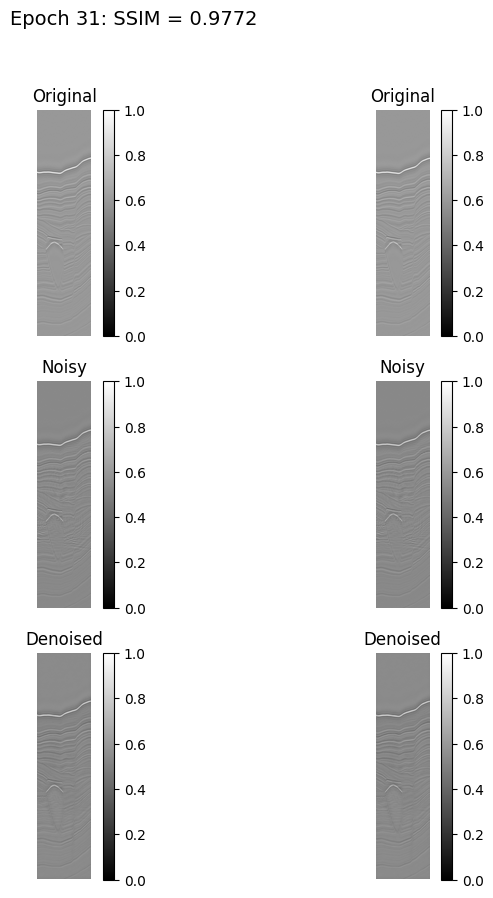

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0143 - val_loss: 0.0209
Epoch 32/70


2025-04-10 02:07:02.353067: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 892 of 1000
2025-04-10 02:07:04.051175: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - loss: 0.0144

2025-04-10 02:08:21.333473: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:08:21.333547: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:08:37.674589: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


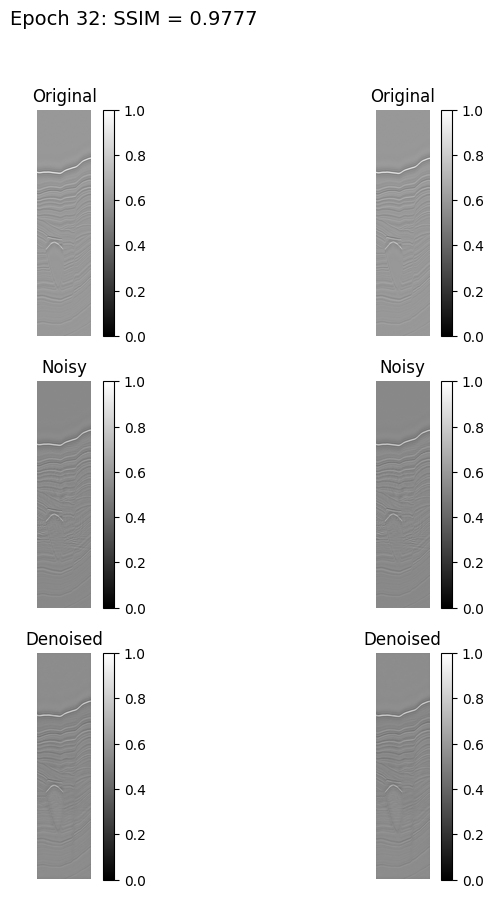

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0144 - val_loss: 0.0199
Epoch 33/70


2025-04-10 02:09:00.290450: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 870 of 1000
2025-04-10 02:09:02.159426: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - loss: 0.0143

2025-04-10 02:10:36.831802: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:10:36.831903: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


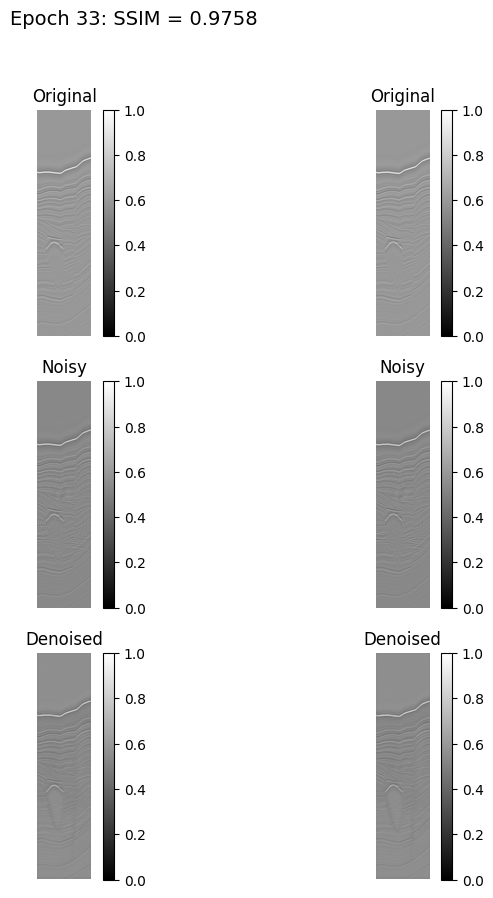

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 898ms/step - loss: 0.0143 - val_loss: 0.0213
Epoch 34/70


2025-04-10 02:10:59.708010: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 893 of 1000
2025-04-10 02:11:01.388431: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0146

2025-04-10 02:12:19.051907: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:12:19.051981: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:12:35.408724: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:12:35.408800: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


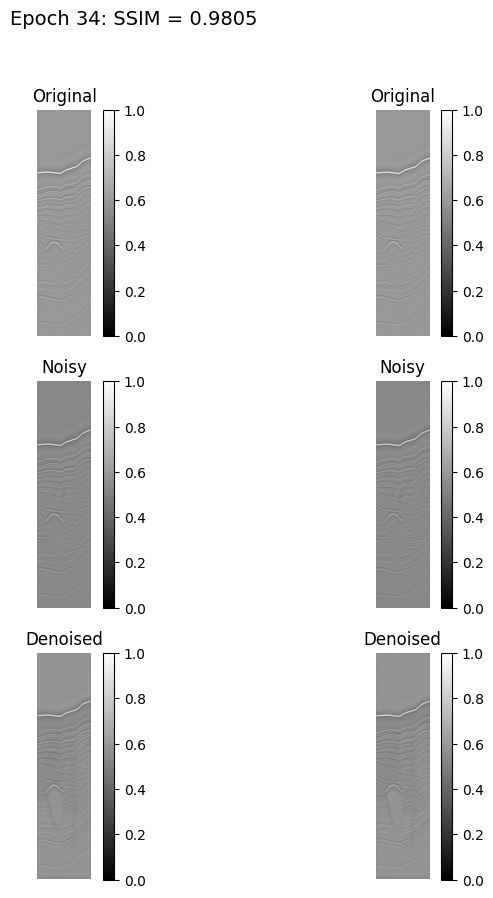

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 891ms/step - loss: 0.0146 - val_loss: 0.0168
Epoch 35/70


2025-04-10 02:12:58.047484: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 885 of 1000
2025-04-10 02:12:59.801076: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 644ms/step - loss: 0.0137

2025-04-10 02:14:33.394293: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:14:33.394376: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


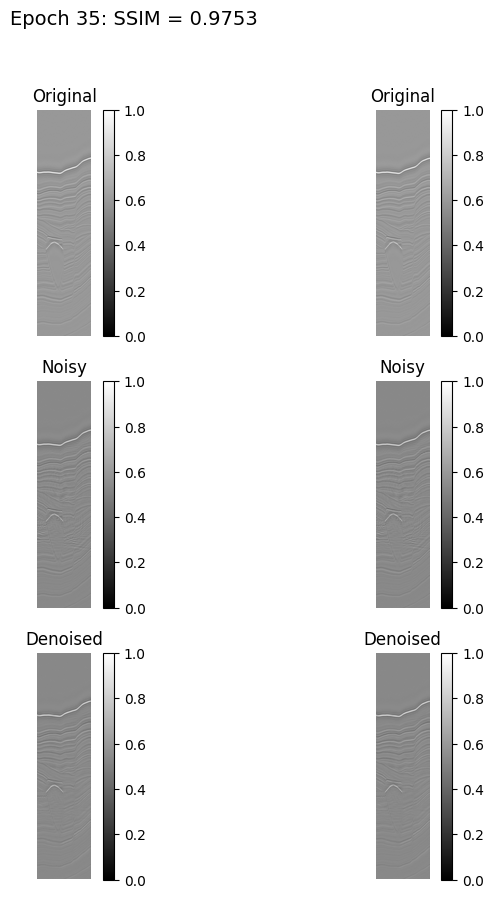

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0137 - val_loss: 0.0224
Epoch 36/70


2025-04-10 02:14:56.093650: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 888 of 1000
2025-04-10 02:14:57.811234: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 646ms/step - loss: 0.0137

2025-04-10 02:16:31.647045: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:16:31.647120: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


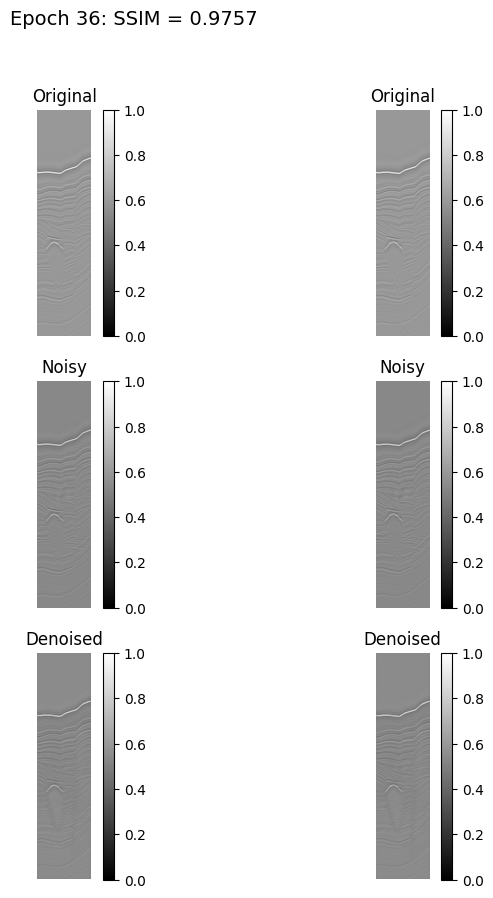

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 890ms/step - loss: 0.0137 - val_loss: 0.0215
Epoch 37/70


2025-04-10 02:16:54.311544: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 875 of 1000
2025-04-10 02:16:56.154575: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 648ms/step - loss: 0.0130

2025-04-10 02:18:13.935408: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:18:13.935486: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:18:30.231471: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:18:30.231537: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


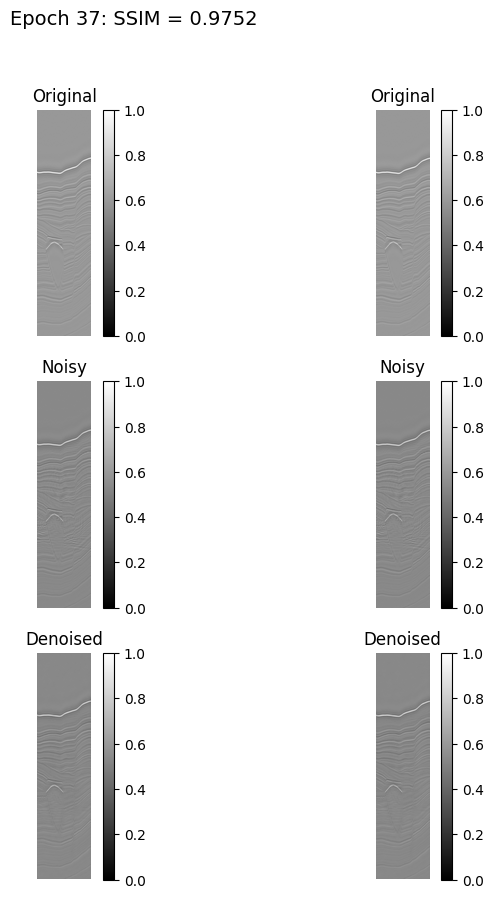

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 894ms/step - loss: 0.0130 - val_loss: 0.0222
Epoch 38/70


2025-04-10 02:18:53.142157: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 899 of 1000
2025-04-10 02:18:54.803953: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - loss: 0.0131

2025-04-10 02:20:13.160325: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:20:13.160414: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:20:29.473291: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:20:29.473363: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


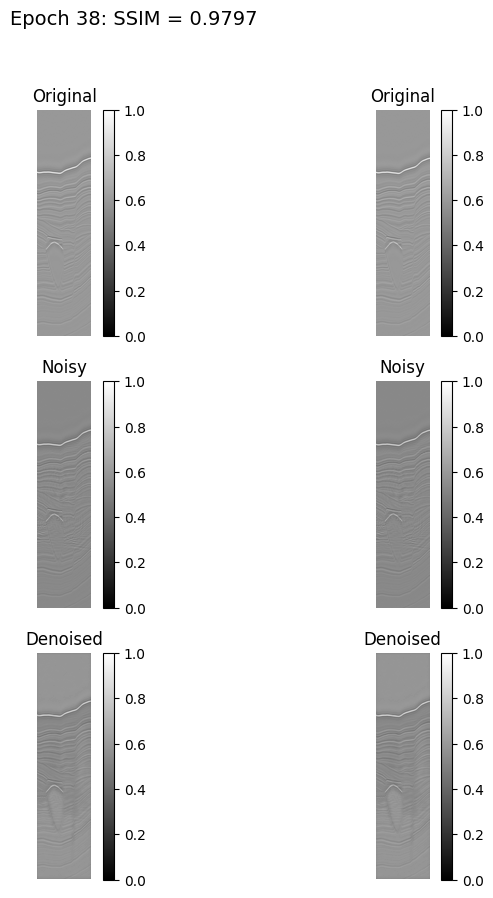

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 895ms/step - loss: 0.0131 - val_loss: 0.0172
Epoch 39/70


2025-04-10 02:20:51.977261: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 886 of 1000
2025-04-10 02:20:53.740108: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0133

2025-04-10 02:22:10.743481: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:22:10.743564: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:22:27.011662: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:22:27.011739: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


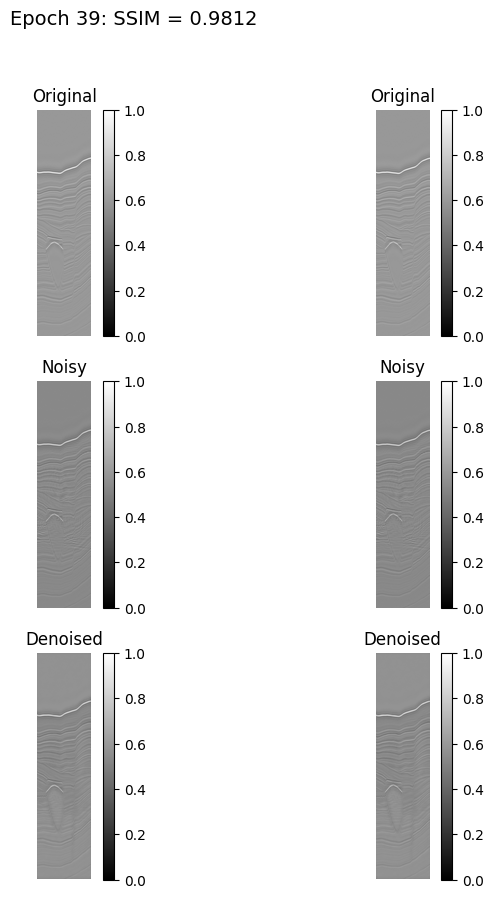

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 884ms/step - loss: 0.0133 - val_loss: 0.0169
Epoch 40/70


2025-04-10 02:22:49.575622: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 892 of 1000
2025-04-10 02:22:51.290077: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 652ms/step - loss: 0.0126

2025-04-10 02:24:25.777485: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:24:25.777564: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


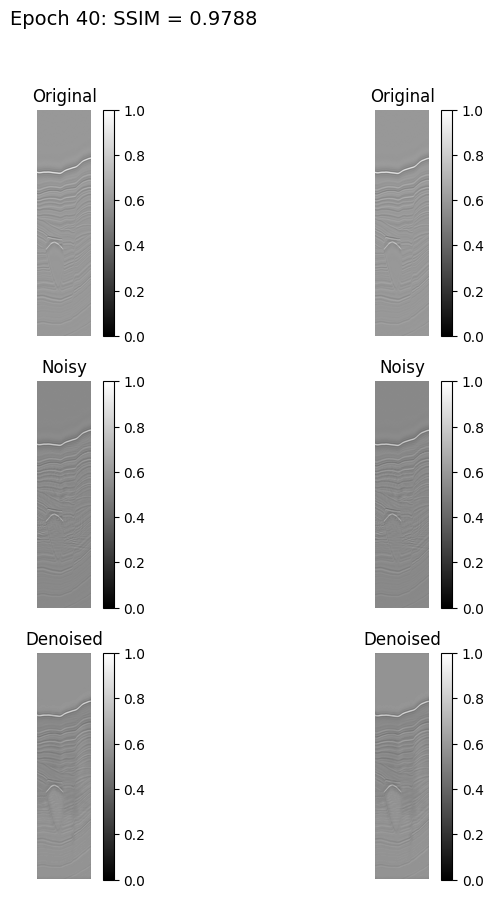

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 894ms/step - loss: 0.0126 - val_loss: 0.0183
Epoch 41/70


2025-04-10 02:24:48.353913: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 887 of 1000
2025-04-10 02:24:50.082709: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 648ms/step - loss: 0.0129

2025-04-10 02:26:07.830321: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:26:07.830400: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:26:24.076879: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


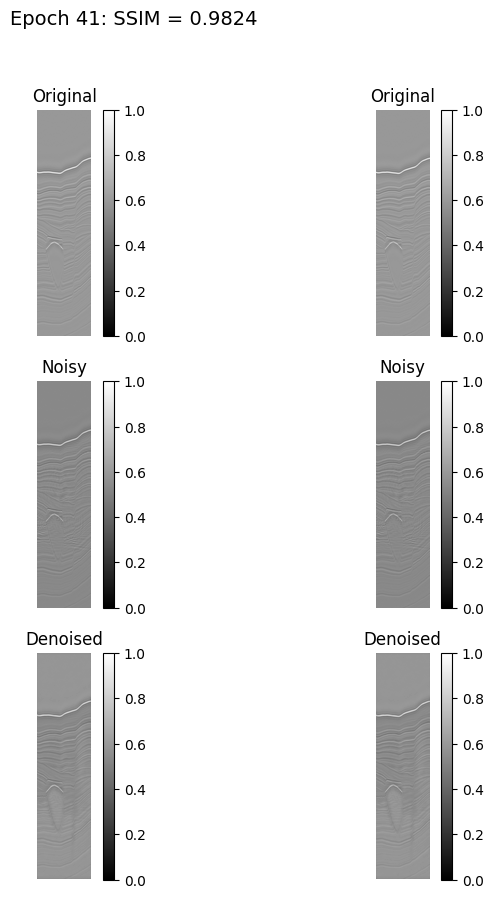

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 892ms/step - loss: 0.0129 - val_loss: 0.0155
Epoch 42/70


2025-04-10 02:26:46.888259: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 881 of 1000
2025-04-10 02:26:48.685525: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0123

2025-04-10 02:28:22.671286: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:28:22.671358: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


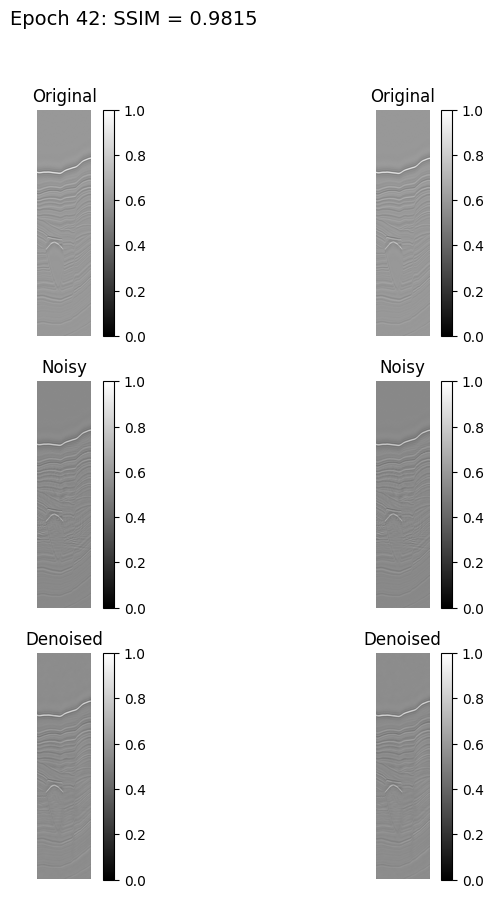

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 890ms/step - loss: 0.0123 - val_loss: 0.0172
Epoch 43/70


2025-04-10 02:28:45.222068: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 891 of 1000
2025-04-10 02:28:46.934156: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0127

2025-04-10 02:30:20.726027: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:30:20.726095: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


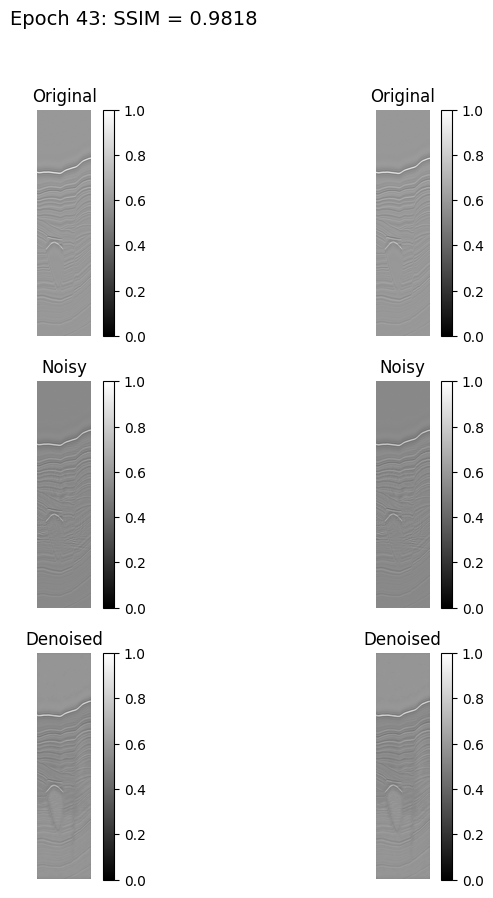

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0127 - val_loss: 0.0161
Epoch 44/70


2025-04-10 02:30:43.171689: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 885 of 1000
2025-04-10 02:30:44.936873: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0120

2025-04-10 02:32:18.548077: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:32:18.548155: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


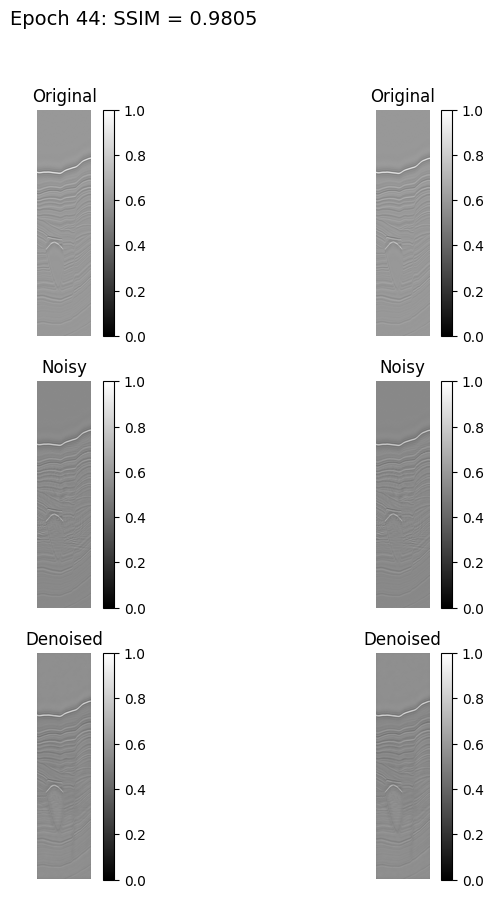

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 888ms/step - loss: 0.0120 - val_loss: 0.0179
Epoch 45/70


2025-04-10 02:32:41.239885: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 896 of 1000
2025-04-10 02:32:42.894153: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 650ms/step - loss: 0.0117

2025-04-10 02:34:17.282030: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:34:17.282069: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


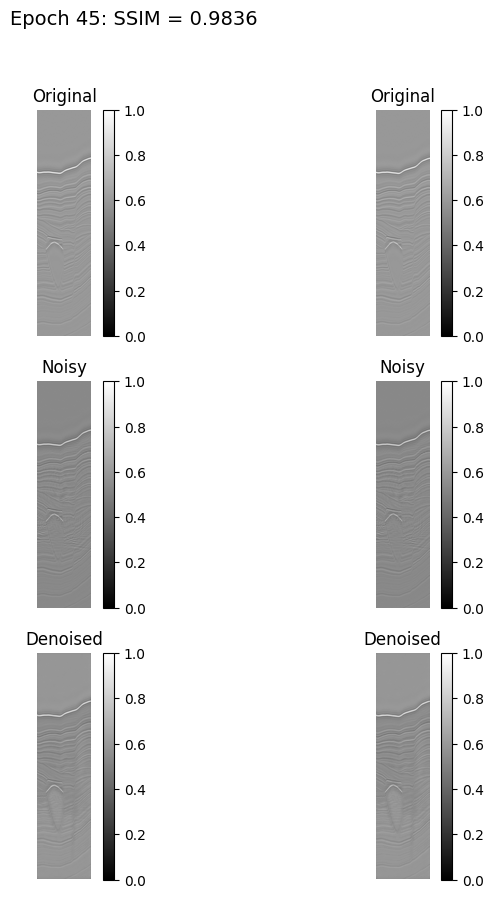

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 894ms/step - loss: 0.0117 - val_loss: 0.0146
Epoch 46/70


2025-04-10 02:34:39.865292: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 878 of 1000
2025-04-10 02:34:41.672266: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - loss: 0.0120

2025-04-10 02:35:59.490341: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:35:59.490420: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:36:15.857539: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:36:15.857618: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


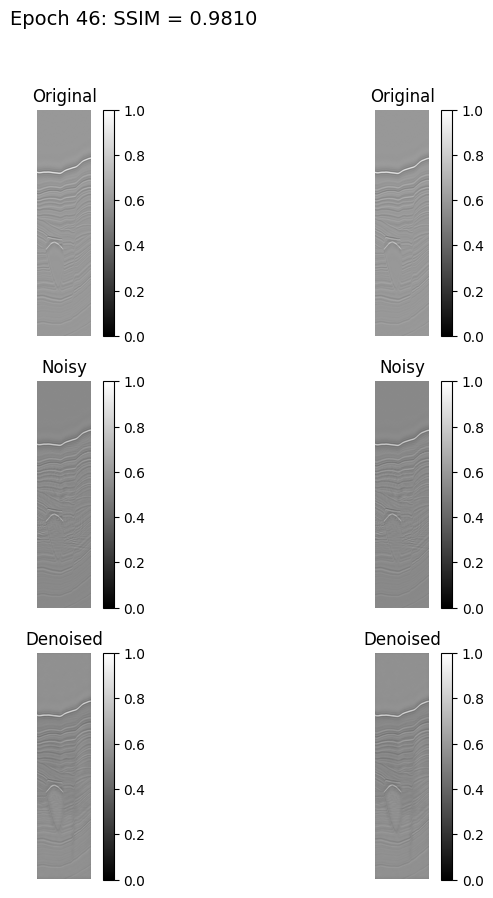

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 894ms/step - loss: 0.0120 - val_loss: 0.0173
Epoch 47/70


2025-04-10 02:36:38.750700: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-10 02:36:40.474390: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - loss: 0.0119

2025-04-10 02:38:15.121208: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:38:15.121281: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


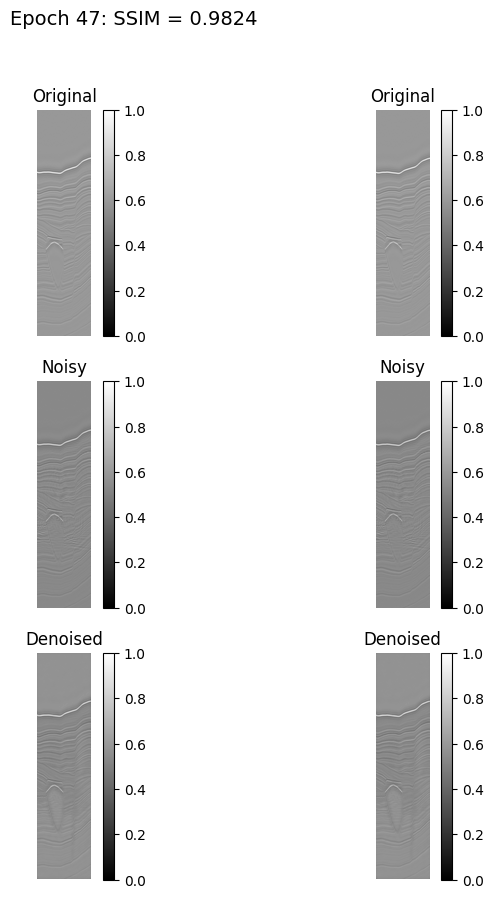

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 896ms/step - loss: 0.0119 - val_loss: 0.0162
Epoch 48/70


2025-04-10 02:38:37.722362: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 892 of 1000
2025-04-10 02:38:39.413181: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0118

2025-04-10 02:40:12.702762: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:40:12.703108: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


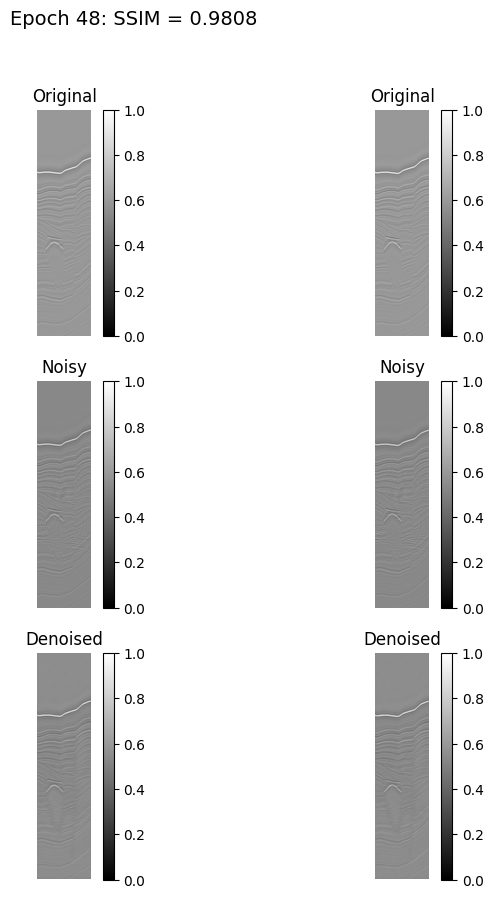

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 885ms/step - loss: 0.0118 - val_loss: 0.0181
Epoch 49/70


2025-04-10 02:40:35.402309: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 883 of 1000
2025-04-10 02:40:37.186728: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0119

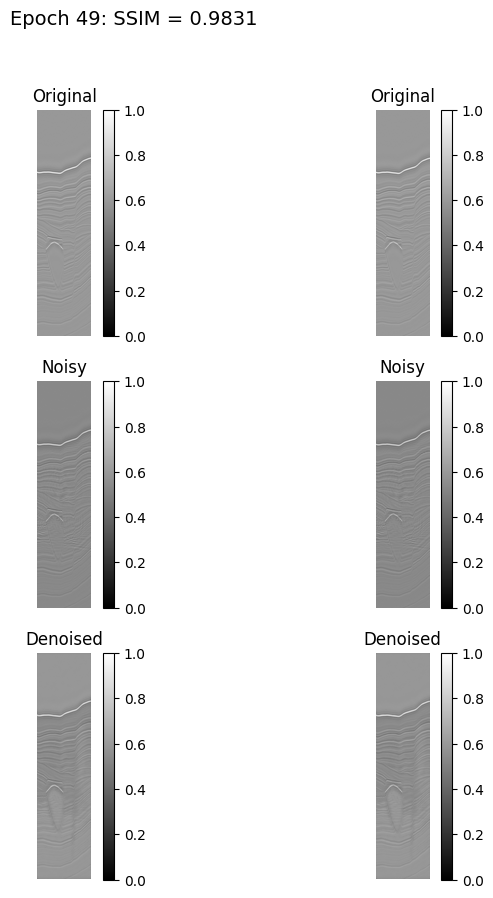

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0119 - val_loss: 0.0152
Epoch 50/70


2025-04-10 02:42:33.658953: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-10 02:42:35.434571: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - loss: 0.0109

2025-04-10 02:43:53.720065: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:43:53.720135: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:44:10.010897: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:44:10.010935: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


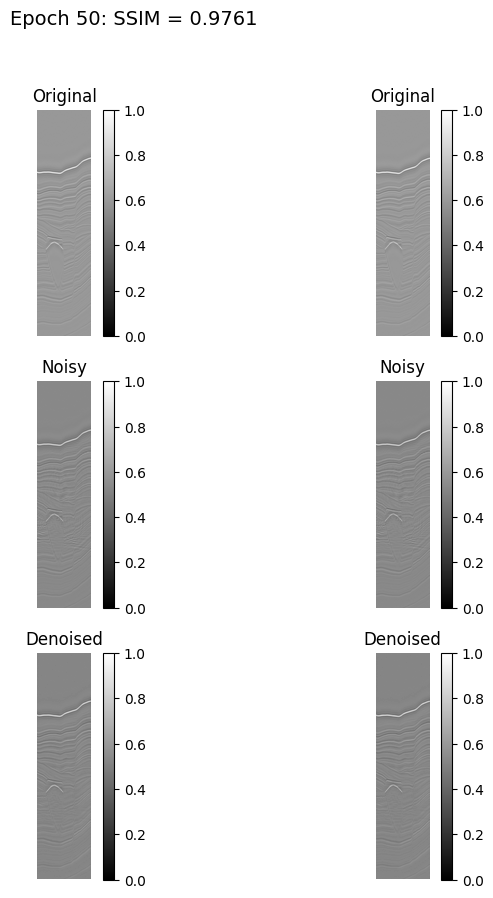

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 897ms/step - loss: 0.0109 - val_loss: 0.0220
Epoch 51/70


2025-04-10 02:44:32.781232: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 876 of 1000
2025-04-10 02:44:34.642799: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0114

2025-04-10 02:45:52.223990: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:45:52.224079: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:46:08.434975: I tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
	 [[{{node IteratorGetNext}}]]
	 [[IteratorGetNext/_2]]
2025-04-10 02:46:08.435032: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:46:08.435064: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


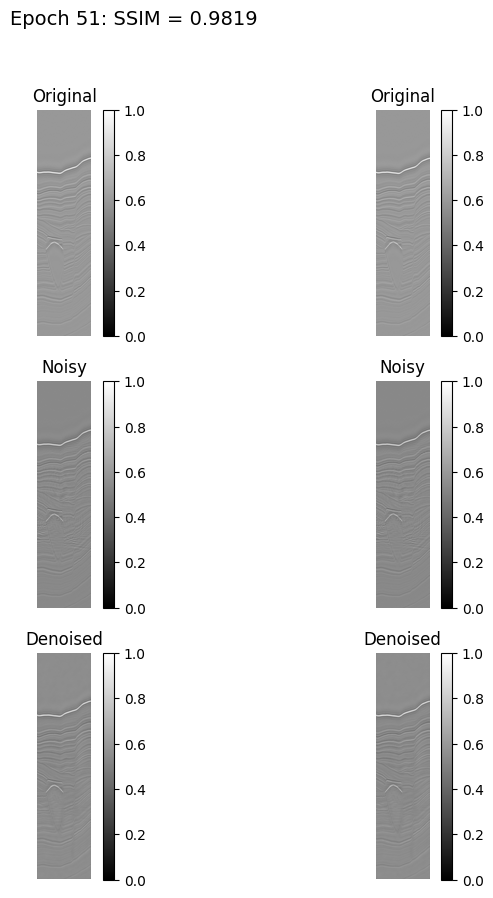

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0114 - val_loss: 0.0172
Epoch 52/70


2025-04-10 02:46:31.115507: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 891 of 1000
2025-04-10 02:46:32.846392: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0110

2025-04-10 02:47:49.958381: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:47:49.958440: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:48:06.134166: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:48:06.134243: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


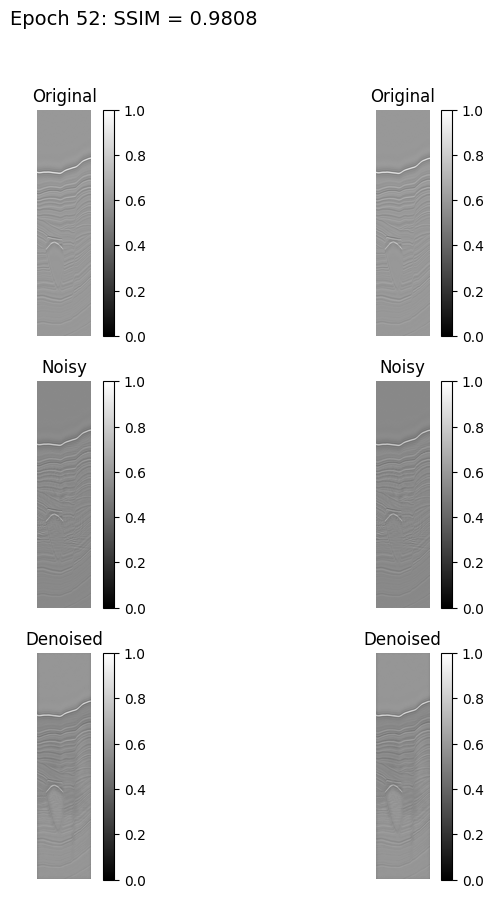

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 884ms/step - loss: 0.0110 - val_loss: 0.0167
Epoch 53/70


2025-04-10 02:48:29.880651: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 901 of 1000
2025-04-10 02:48:30.301794: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 648ms/step - loss: 0.0114

2025-04-10 02:50:04.361258: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:50:04.361328: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


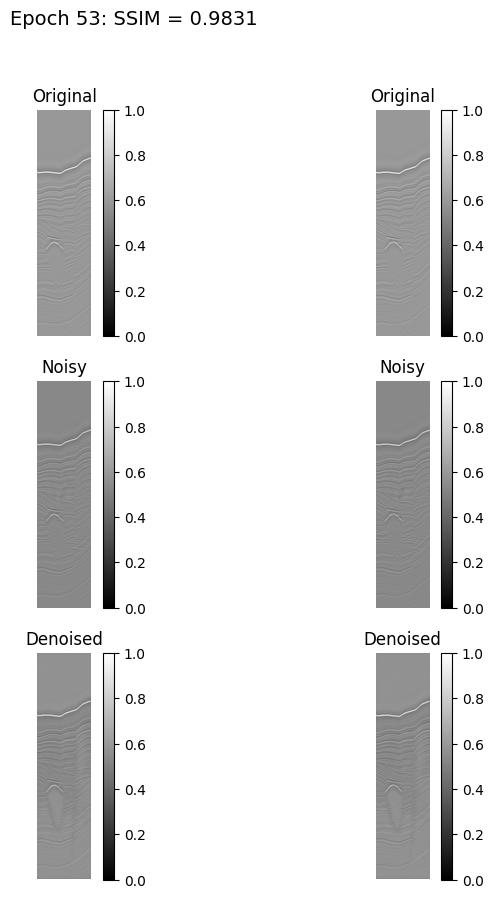

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 891ms/step - loss: 0.0114 - val_loss: 0.0160
Epoch 54/70


2025-04-10 02:50:26.944110: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 875 of 1000
2025-04-10 02:50:28.774640: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 651ms/step - loss: 0.0110

2025-04-10 02:51:46.875172: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:51:46.875249: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:52:03.284943: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:52:03.285024: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


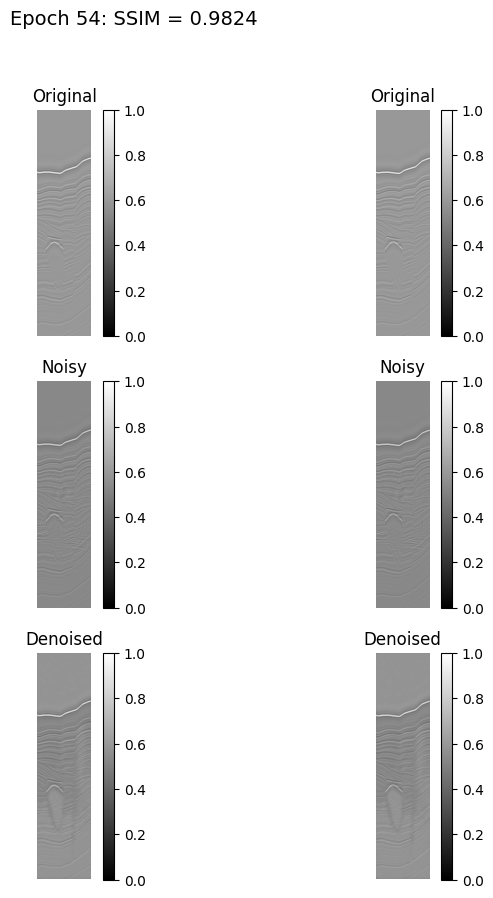

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 897ms/step - loss: 0.0110 - val_loss: 0.0163
Epoch 55/70


2025-04-10 02:52:26.141139: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 882 of 1000
2025-04-10 02:52:27.926648: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0108

2025-04-10 02:54:01.689862: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:54:01.689922: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


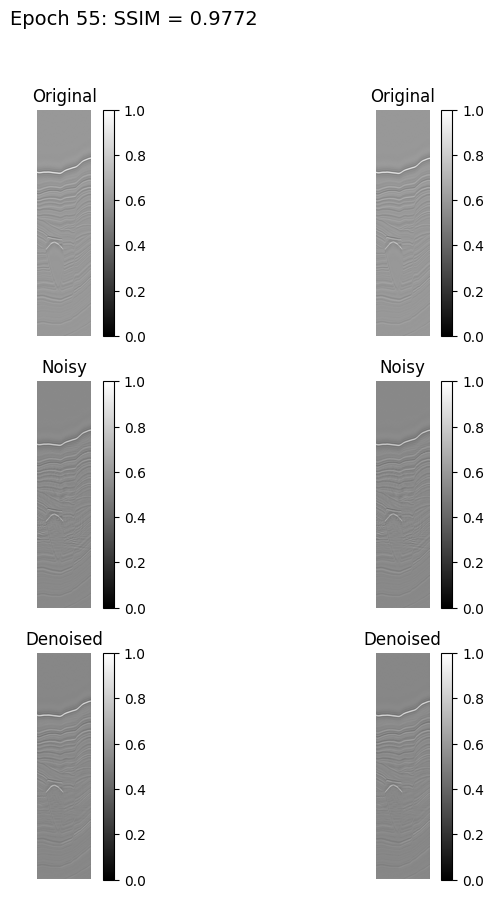

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 889ms/step - loss: 0.0108 - val_loss: 0.0213
Epoch 56/70


2025-04-10 02:54:24.323148: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 888 of 1000
2025-04-10 02:54:26.079718: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0109

2025-04-10 02:55:59.697534: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:55:59.697592: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


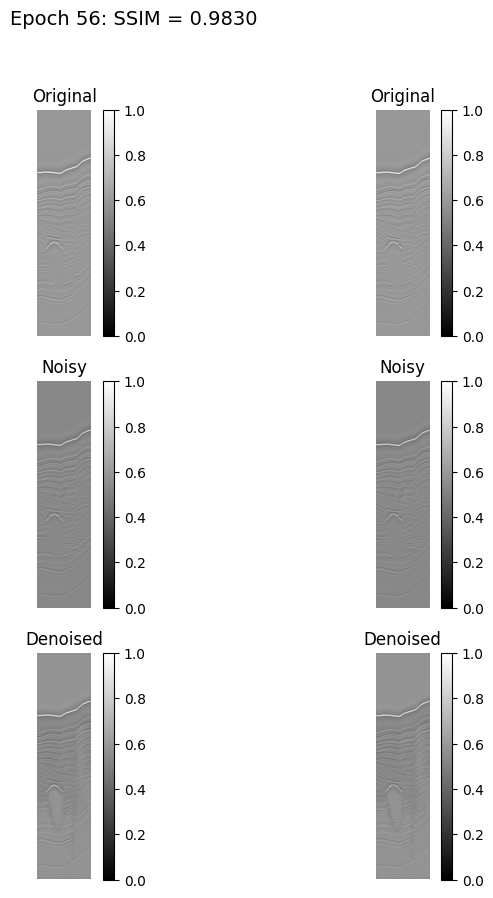

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0109 - val_loss: 0.0155
Epoch 57/70


2025-04-10 02:56:22.261794: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 879 of 1000
2025-04-10 02:56:24.078937: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 651ms/step - loss: 0.0105

2025-04-10 02:57:58.541789: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:57:58.541883: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


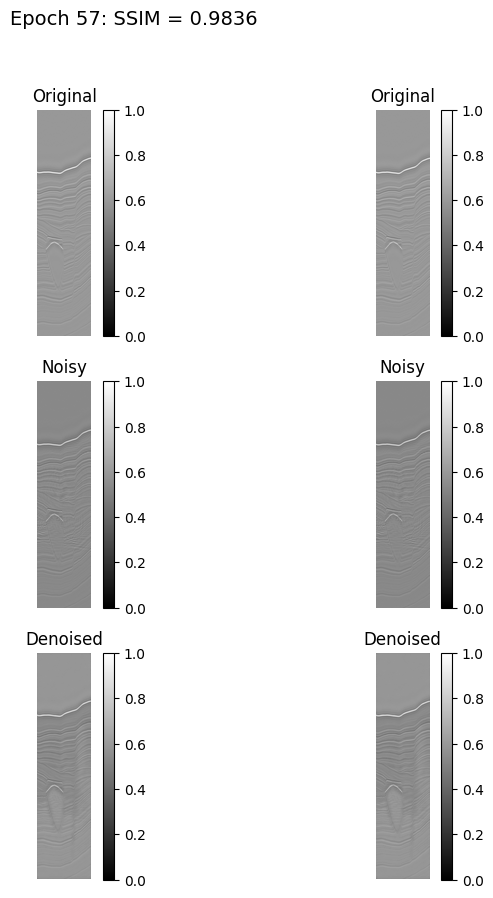

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 895ms/step - loss: 0.0105 - val_loss: 0.0152
Epoch 58/70


2025-04-10 02:58:21.225361: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 870 of 1000
2025-04-10 02:58:23.102121: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - loss: 0.0104

2025-04-10 02:59:40.961672: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:59:40.961747: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 02:59:57.250648: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 02:59:57.250726: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


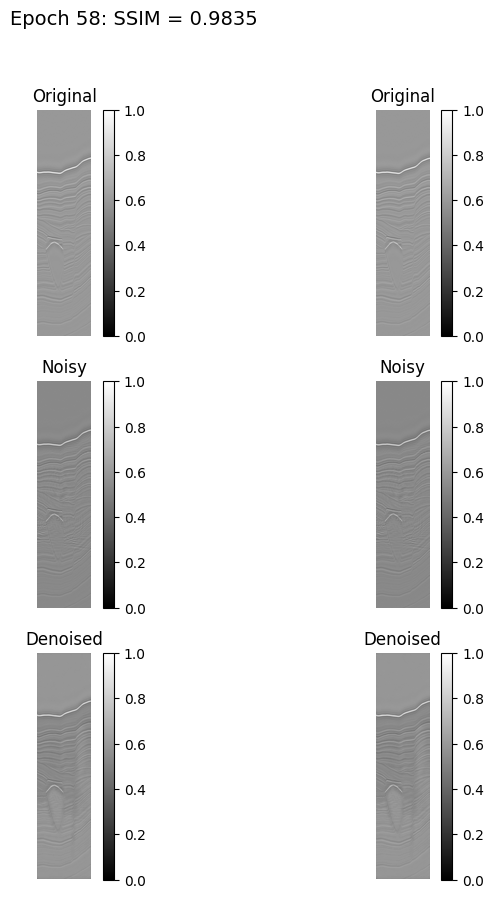

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 894ms/step - loss: 0.0104 - val_loss: 0.0154
Epoch 59/70


2025-04-10 03:00:20.176704: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 887 of 1000
2025-04-10 03:00:21.924385: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - loss: 0.0103

2025-04-10 03:01:39.792578: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 03:01:56.094964: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:01:56.095029: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


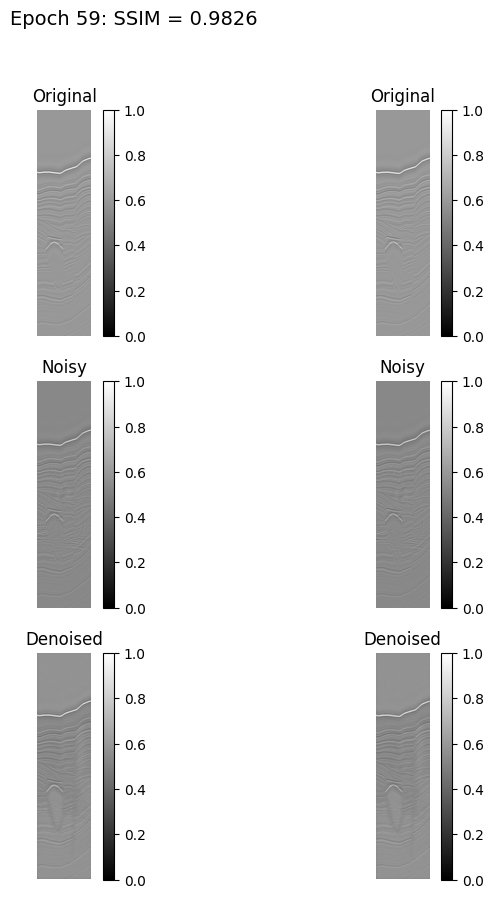

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 893ms/step - loss: 0.0103 - val_loss: 0.0162
Epoch 60/70


2025-04-10 03:02:18.835219: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 869 of 1000
2025-04-10 03:02:20.733449: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 642ms/step - loss: 0.0103

2025-04-10 03:03:53.993936: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:03:53.994013: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


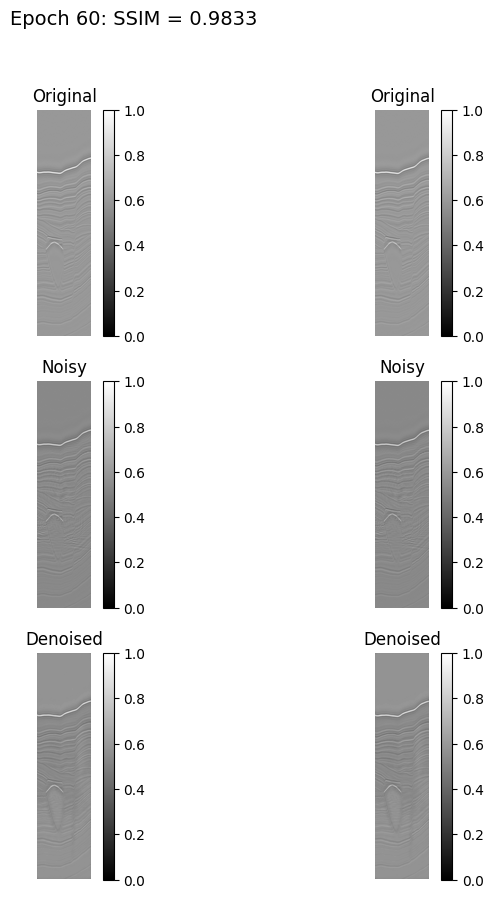

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 885ms/step - loss: 0.0103 - val_loss: 0.0156
Epoch 61/70


2025-04-10 03:04:16.675784: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 897 of 1000
2025-04-10 03:04:18.360305: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 645ms/step - loss: 0.0102

2025-04-10 03:05:52.024124: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:05:52.024182: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


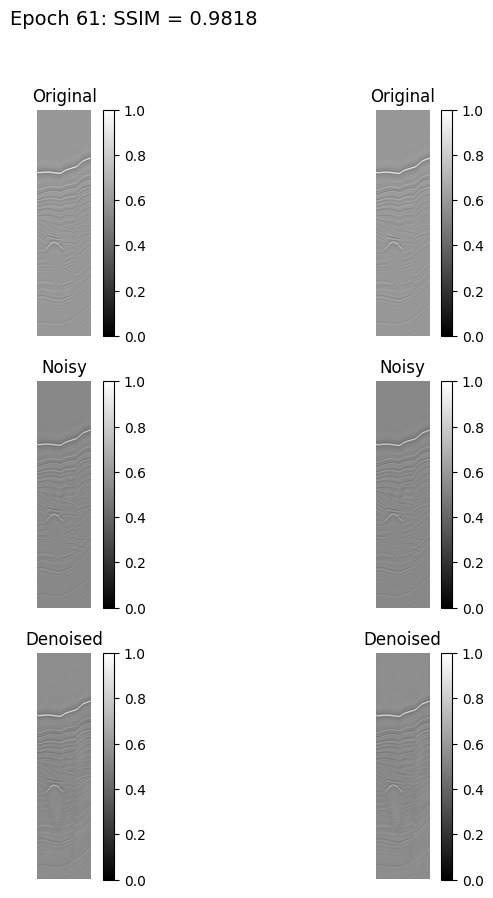

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 887ms/step - loss: 0.0102 - val_loss: 0.0174
Epoch 62/70


2025-04-10 03:06:14.582318: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 898 of 1000
2025-04-10 03:06:16.257258: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 647ms/step - loss: 0.0103

2025-04-10 03:07:50.269771: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:07:50.269864: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


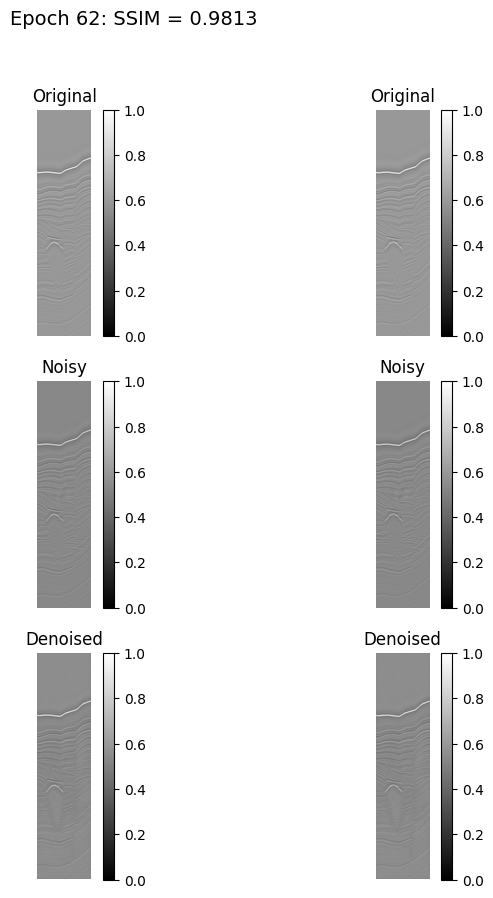

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 892ms/step - loss: 0.0103 - val_loss: 0.0181
Epoch 63/70


2025-04-10 03:08:13.012725: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 894 of 1000
2025-04-10 03:08:14.712450: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 653ms/step - loss: 0.0103

2025-04-10 03:09:33.051540: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:09:33.051624: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 03:09:49.296616: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:09:49.296695: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


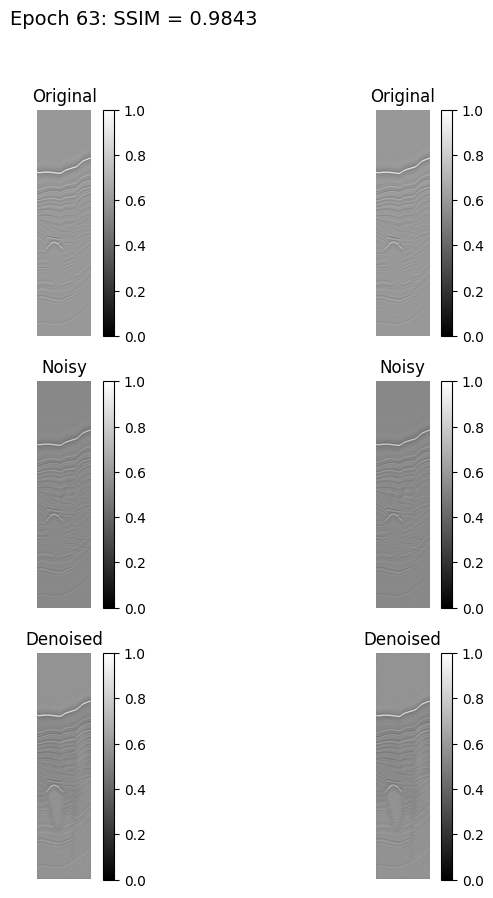

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 896ms/step - loss: 0.0103 - val_loss: 0.0150
Epoch 64/70


2025-04-10 03:10:11.981677: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 873 of 1000
2025-04-10 03:10:13.846526: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 649ms/step - loss: 0.0100

2025-04-10 03:11:48.131534: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:11:48.131609: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


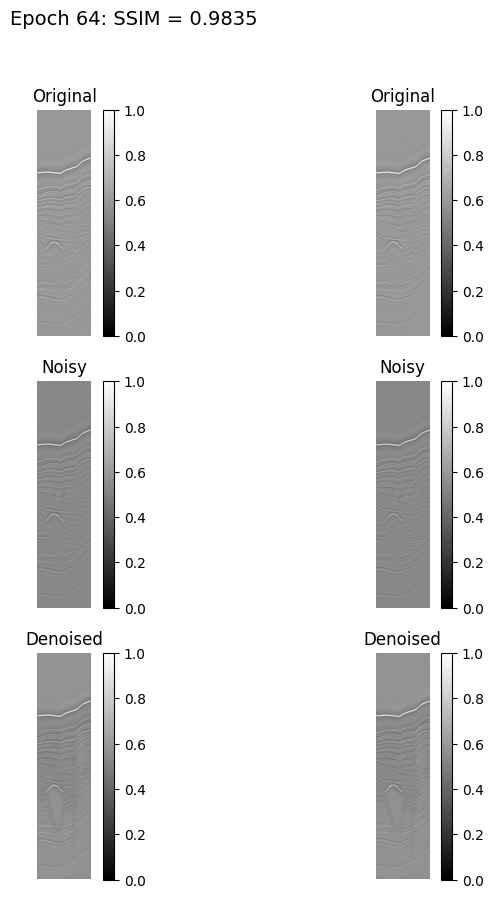

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 893ms/step - loss: 0.0100 - val_loss: 0.0157
Epoch 65/70


2025-04-10 03:12:10.783571: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 888 of 1000
2025-04-10 03:12:12.521107: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 643ms/step - loss: 0.0099

2025-04-10 03:13:45.972830: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:13:45.972881: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


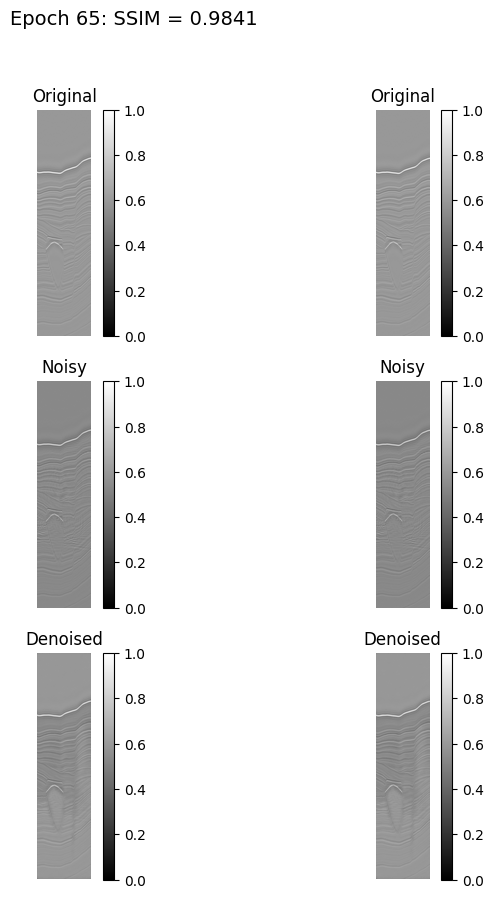

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 885ms/step - loss: 0.0099 - val_loss: 0.0154
Epoch 66/70


2025-04-10 03:14:08.505226: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 899 of 1000
2025-04-10 03:14:10.175094: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 650ms/step - loss: 0.0097

2025-04-10 03:15:28.161749: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:15:28.161837: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 03:15:44.462308: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:15:44.462378: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


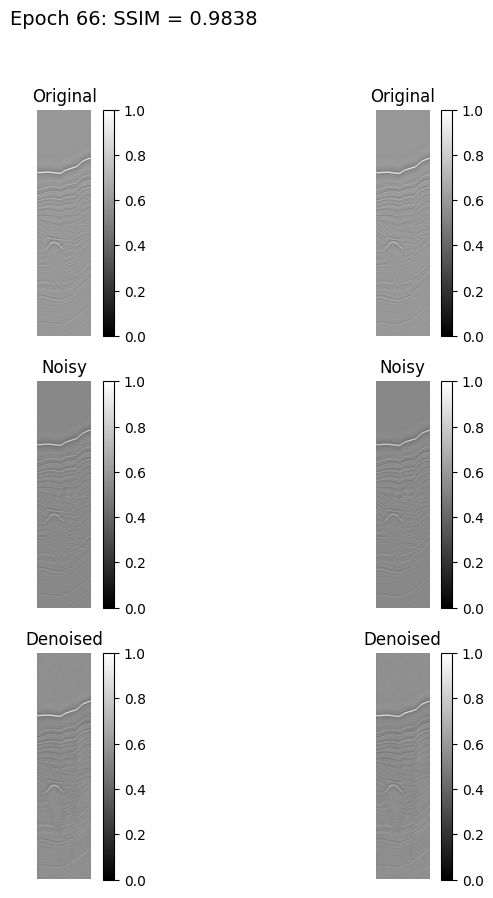

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 895ms/step - loss: 0.0097 - val_loss: 0.0157
Epoch 67/70


2025-04-10 03:16:07.319830: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 894 of 1000
2025-04-10 03:16:09.007749: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 648ms/step - loss: 0.0098

2025-04-10 03:17:43.106490: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:17:43.106572: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


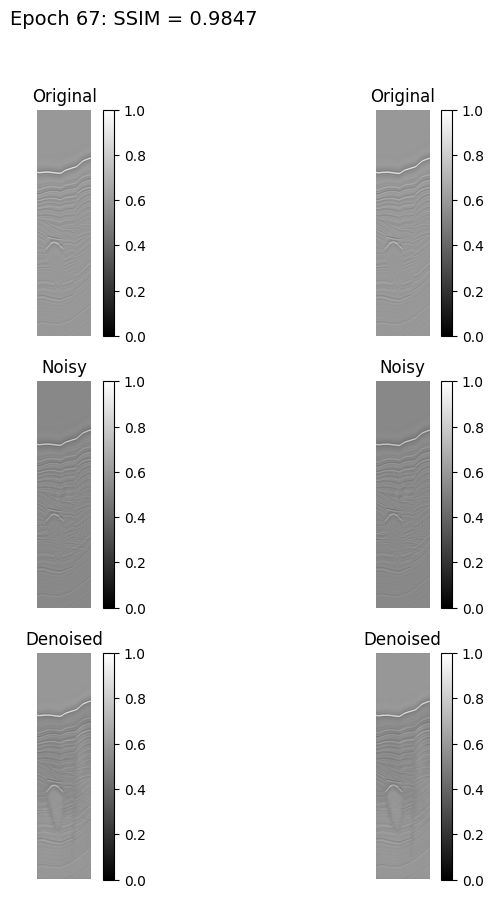

120/120 ━━━━━━━━━━━━━━━━━━━━ 118s 892ms/step - loss: 0.0098 - val_loss: 0.0146
Epoch 68/70


2025-04-10 03:18:05.779595: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 889 of 1000
2025-04-10 03:18:07.501941: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 661ms/step - loss: 0.0097

2025-04-10 03:19:42.953620: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:19:42.953700: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


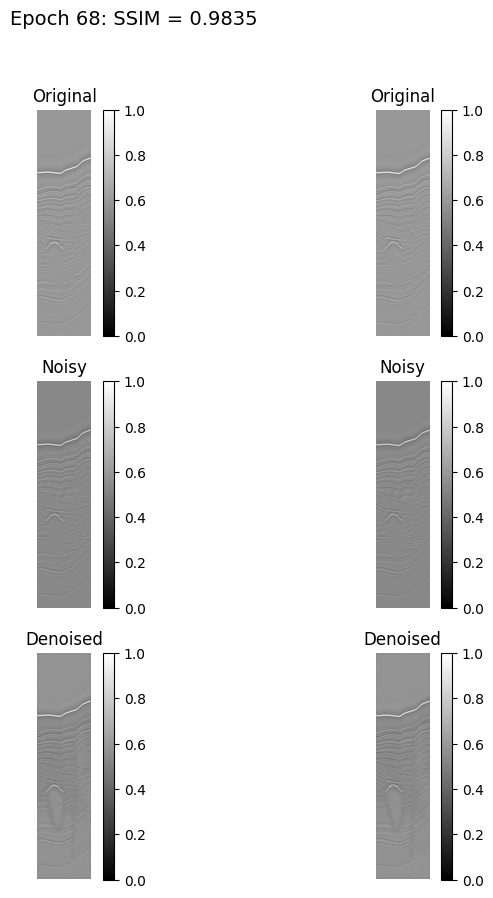

120/120 ━━━━━━━━━━━━━━━━━━━━ 120s 902ms/step - loss: 0.0097 - val_loss: 0.0160
Epoch 69/70


2025-04-10 03:20:05.523358: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 899 of 1000
2025-04-10 03:20:07.159529: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 641ms/step - loss: 0.0097

2025-04-10 03:21:40.288154: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:21:40.288231: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


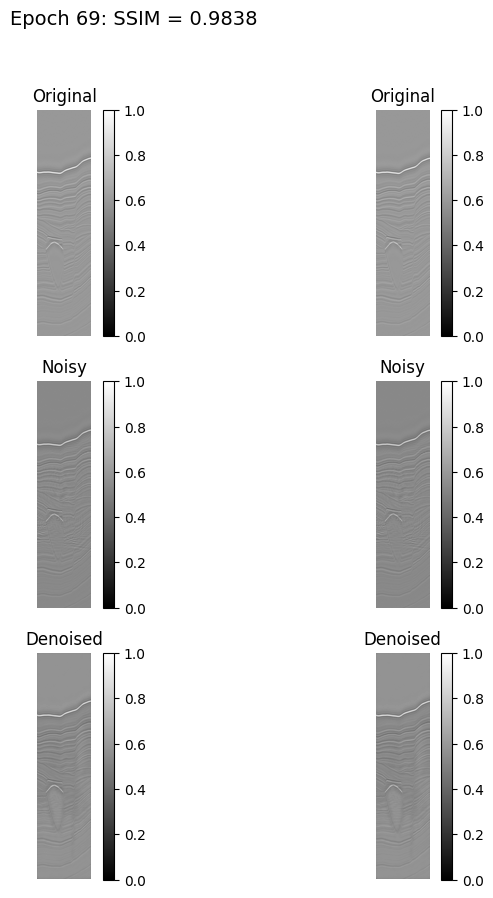

120/120 ━━━━━━━━━━━━━━━━━━━━ 117s 884ms/step - loss: 0.0097 - val_loss: 0.0158
Epoch 70/70


2025-04-10 03:22:03.006327: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:450] ShuffleDatasetV3:3: Filling up shuffle buffer (this may take a while): 897 of 1000
2025-04-10 03:22:04.707643: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:480] Shuffle buffer filled.


120/120 ━━━━━━━━━━━━━━━━━━━━ 0s 650ms/step - loss: 0.0093

2025-04-10 03:23:22.722796: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:23:22.722868: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350
2025-04-10 03:23:38.940655: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 3750303232253565177
2025-04-10 03:23:38.940737: I tensorflow/core/framework/local_rendezvous.cc:423] Local rendezvous recv item cancelled. Key hash: 16741737754130548350


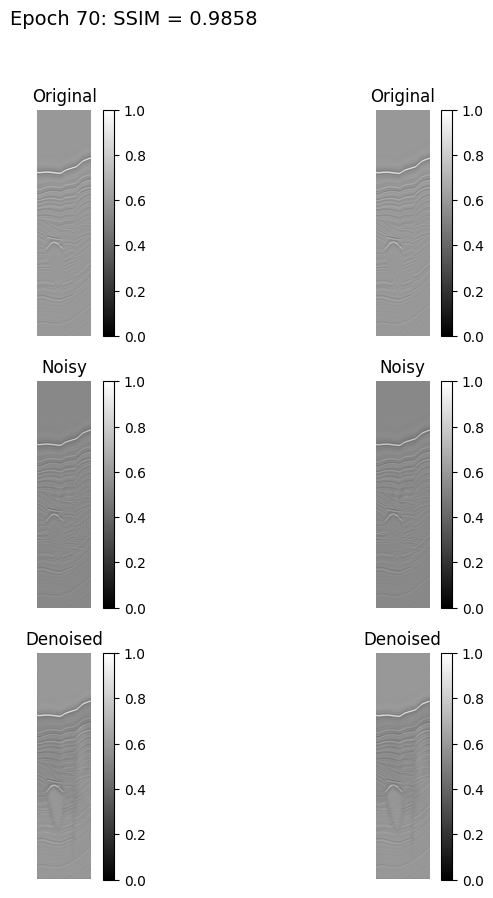

120/120 ━━━━━━━━━━━━━━━━━━━━ 119s 895ms/step - loss: 0.0093 - val_loss: 0.0139


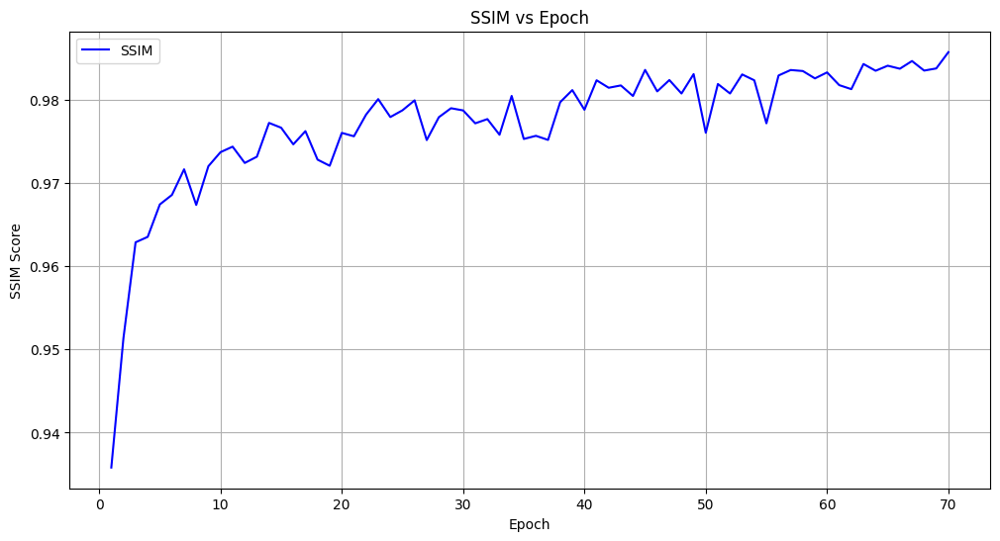

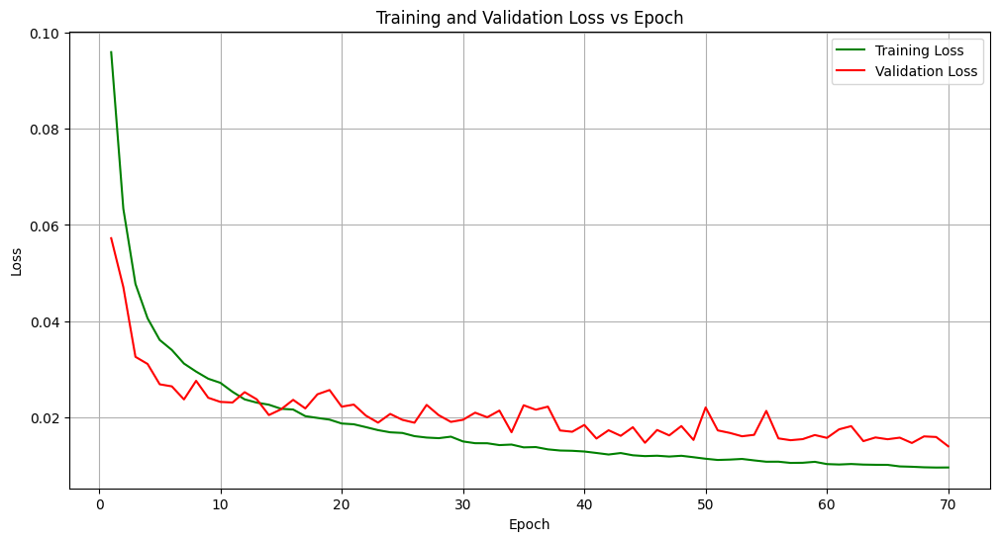

In [5]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from skimage.metrics import structural_similarity as ssim
from tensorflow.keras.callbacks import EarlyStopping


# Function to visualize a few pairs of noisy and clean training data

def visualize_training_data(train_dataset, num_pairs=3):
    for noisy_batch, clean_batch in train_dataset.take(1):
        fig, axes = plt.subplots(2, num_pairs, figsize=(8, 10))
        
        for i in range(num_pairs):
            # Noisy image
            im1 = axes[0, i].imshow(noisy_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            axes[0, i].set_title("Noisy", fontsize=12)
            axes[0, i].axis('off')
            fig.colorbar(im1, ax=axes[0, i], fraction=0.046, pad=0.04)  # Add colorbar

            # Clean image
            im2 = axes[1, i].imshow(clean_batch[i].numpy().squeeze(), cmap='gray', vmin=0, vmax=1)
            axes[1, i].set_title("Clean", fontsize=12)
            axes[1, i].axis('off')
            fig.colorbar(im2, ax=axes[1, i], fraction=0.046, pad=0.04)  # Add colorbar

        plt.tight_layout()
        plt.show()

# Run the visualization
visualize_training_data(train_dataset, num_pairs=3)

early_stop = EarlyStopping(
    monitor='val_loss',      # Watch validation loss
    patience=5,              # Wait 5 epochs without improvement
    restore_best_weights=True  # Roll back to the best weights
)

# Train the model with the callback
history = autoencoder.fit(
    train_dataset,
    epochs=70,  # Adjust as needed
    validation_data=val_dataset,
    callbacks=[DisplayCallback()]
)
autoencoder.save('seismic_denoising_unet.h5')  # Save to a .h5 file


# Plot training loss, validation loss, and SSIM over epochs
epochs = range(1, len(history.history['loss']) + 1)
plt.figure(figsize=(12, 6))
plt.plot(epochs, history.history['loss'], 'g-', label='Training Loss')
plt.plot(epochs, history.history['val_loss'], 'r-', label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss vs Epoch')
plt.grid(True)
plt.show()


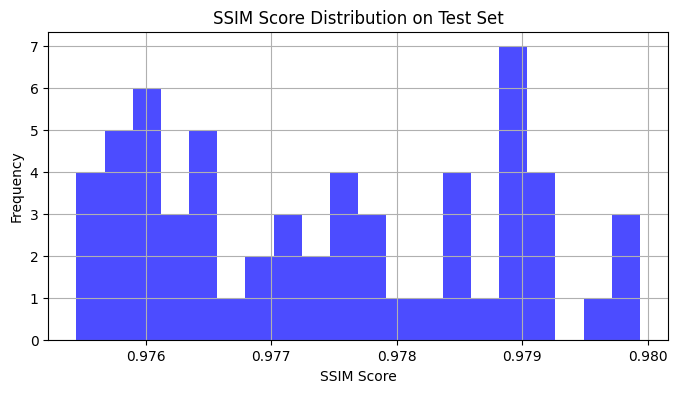

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
from skimage.metrics import structural_similarity as ssim
import random

# Compute SSIM on test set
test_ssim_scores = []
noisy_images = []
clean_images = []
denoised_images = []

for noisy_batch, clean_batch in test_dataset:
    # Denoise the noisy images using the model
    denoised_imgs = autoencoder.predict(noisy_batch, verbose=0)

    for i in range(len(clean_batch)):
        score = ssim(clean_batch[i].numpy().squeeze(), 
                     denoised_imgs[i].squeeze(), 
                     data_range=1.0)
        test_ssim_scores.append(score)

        # Store images for visualization
        noisy_images.append(noisy_batch[i].numpy().squeeze())   # Noisy Image
        clean_images.append(clean_batch[i].numpy().squeeze())   # Clean Ground Truth
        denoised_images.append(denoised_imgs[i].squeeze())      # Model Output

# SSIM Distribution Plot
plt.figure(figsize=(8, 4))
plt.hist(test_ssim_scores, bins=20, color='b', alpha=0.7)
plt.xlabel('SSIM Score')
plt.ylabel('Frequency')
plt.title('SSIM Score Distribution on Test Set')
plt.grid(True)
plt.show()



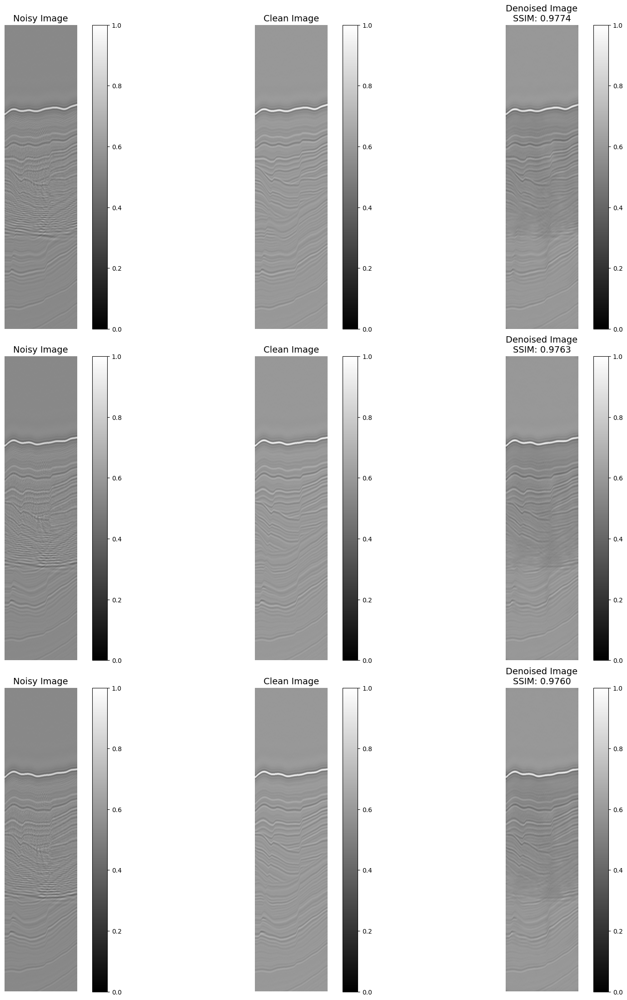

In [7]:
import matplotlib.pyplot as plt
import random

# Choose 3 random indices
random_indices = random.sample(range(len(noisy_images)), 3)

# Create 3x3 grid: Noisy | Clean | Denoised
fig, axes = plt.subplots(3, 3, figsize=(20, 22))  # Wider figure

for idx, rand_idx in enumerate(random_indices):
    ssim_score = test_ssim_scores[rand_idx]
    vmin, vmax = 0, 1

    # Noisy Image
    im1 = axes[idx, 0].imshow(noisy_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title("Noisy Image", fontsize=14)
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)

    # Clean Image
    im2 = axes[idx, 1].imshow(clean_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Clean Image", fontsize=14)
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)

    # Denoised Image
    im3 = axes[idx, 2].imshow(denoised_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}", fontsize=14)
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)

# Adjust spacing for neat layout
plt.subplots_adjust(hspace=0.3, wspace=0.1)
plt.tight_layout()
plt.show()


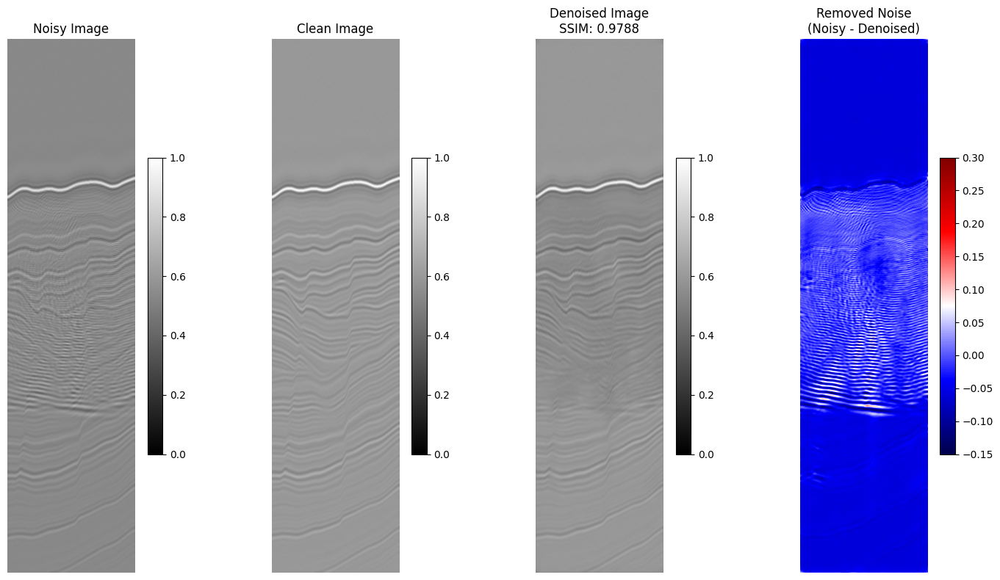

In [8]:
import matplotlib.pyplot as plt
import random

# Choose one random index
rand_idx = random.choice(range(len(noisy_images)))
ssim_score = test_ssim_scores[rand_idx]
vmin, vmax = 0, 1
noise_min, noise_max = -0.15, 0.3  # Adjust depending on dynamic range of noise

# Calculate removed noise
removed_noise = noisy_images[rand_idx] - denoised_images[rand_idx]

# Create 1x4 subplot
fig, axes = plt.subplots(1, 4, figsize=(16, 8))  # Wider figure

# Noisy Image
im0 = axes[0].imshow(noisy_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[0].set_title("Noisy Image", fontsize=12)
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

# Clean Image
im1 = axes[1].imshow(clean_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[1].set_title("Clean Image", fontsize=12)
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

# Denoised Image
im2 = axes[2].imshow(denoised_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}", fontsize=12)
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

# Removed Noise
im3 = axes[3].imshow(removed_noise.squeeze(), cmap='seismic', vmin=noise_min, vmax=noise_max)
axes[3].set_title("Removed Noise\n(Noisy - Denoised)", fontsize=12)
axes[3].axis('off')
fig.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

# Adjust spacing
plt.subplots_adjust(wspace=0.05)
plt.tight_layout()
plt.show()


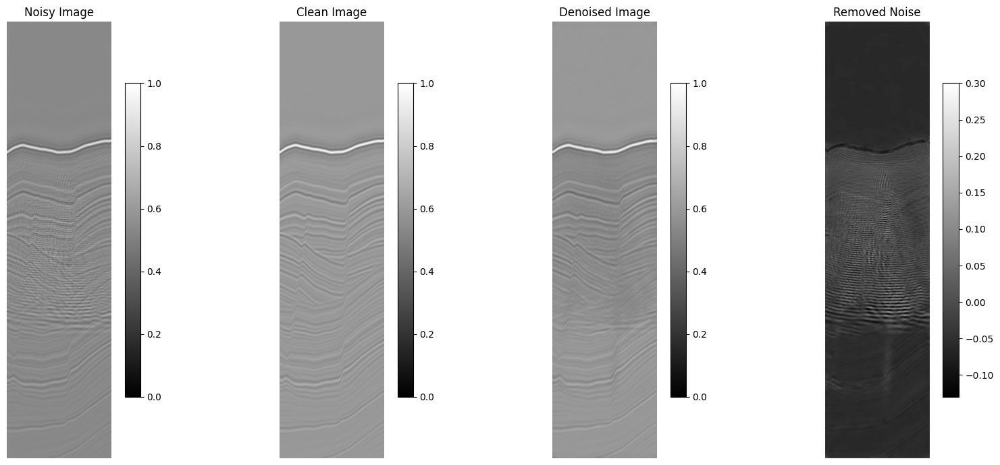

In [9]:
import matplotlib.pyplot as plt
import random

# Select one random index
rand_idx = random.choice(range(len(noisy_images)))

# Compute removed noise = noisy - denoised
removed_noise = noisy_images[rand_idx] - denoised_images[rand_idx]

# Set color scales
vmin, vmax = 0, 1  # For normalized images
noise_min, noise_max = -0.13, 0.3  # For removed noise

# Plot: Noisy | Clean | Denoised | Removed Noise
fig, axes = plt.subplots(1, 4, figsize=(18, 7))  # Wider layout

# Noisy Image
im0 = axes[0].imshow(noisy_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[0].set_title("Noisy Image", fontsize=12)
axes[0].axis('off')
fig.colorbar(im0, ax=axes[0], fraction=0.046, pad=0.04)

# Clean Image
im1 = axes[1].imshow(clean_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[1].set_title("Clean Image", fontsize=12)
axes[1].axis('off')
fig.colorbar(im1, ax=axes[1], fraction=0.046, pad=0.04)

# Denoised Image
im2 = axes[2].imshow(denoised_images[rand_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
axes[2].set_title("Denoised Image", fontsize=12)
axes[2].axis('off')
fig.colorbar(im2, ax=axes[2], fraction=0.046, pad=0.04)

# Removed Noise (Noisy - Denoised)
im3 = axes[3].imshow(removed_noise.squeeze(), cmap='gray', vmin=noise_min, vmax=noise_max)
axes[3].set_title("Removed Noise", fontsize=12)
axes[3].axis('off')
fig.colorbar(im3, ax=axes[3], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()



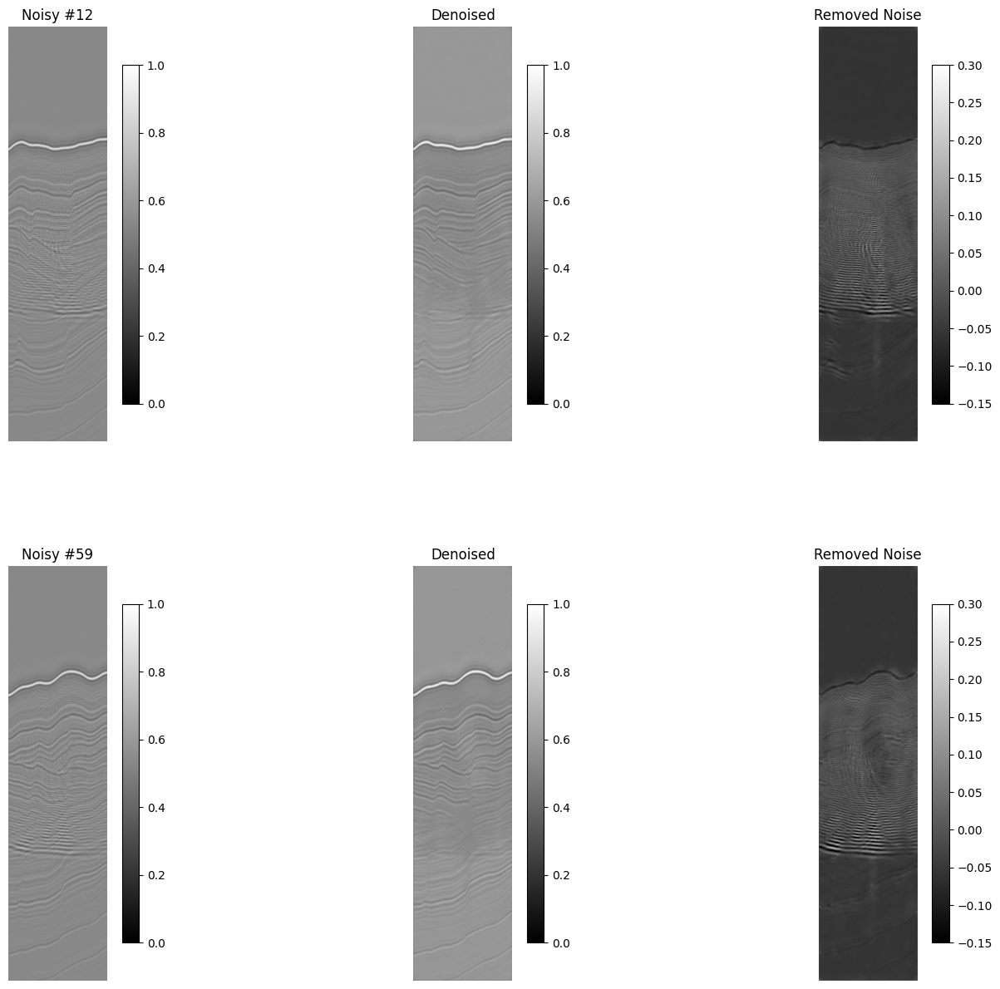

In [10]:
import matplotlib.pyplot as plt

# Example: Choose your own indices from test dataset
chosen_indices = [12, 59]  # Make sure these indices are valid

# Create a wide figure with more spacing between rows
fig, axes = plt.subplots(len(chosen_indices), 3, figsize=(15, 6 * len(chosen_indices)))

# Ensure axes is always 2D (even if 1 row)
if len(chosen_indices) == 1:
    axes = axes.reshape(1, -1)

for idx, img_idx in enumerate(chosen_indices):
    removed_noise = noisy_images[img_idx] - denoised_images[img_idx]

    vmin, vmax = 0, 1
    noise_min, noise_max = -0.15, 0.3

    # Noisy
    im1 = axes[idx, 0].imshow(noisy_images[img_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title(f"Noisy #{img_idx}", fontsize=12)
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)

    # Denoised
    im2 = axes[idx, 1].imshow(denoised_images[img_idx].squeeze(), cmap='gray', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Denoised", fontsize=12)
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)

    # Removed Noise
    im3 = axes[idx, 2].imshow(removed_noise.squeeze(), cmap='gray', vmin=noise_min, vmax=noise_max)
    axes[idx, 2].set_title("Removed Noise", fontsize=12)
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)

plt.tight_layout()
plt.subplots_adjust(hspace=0.3, wspace=0.1)  # Adjust spacing between subplots
plt.show()



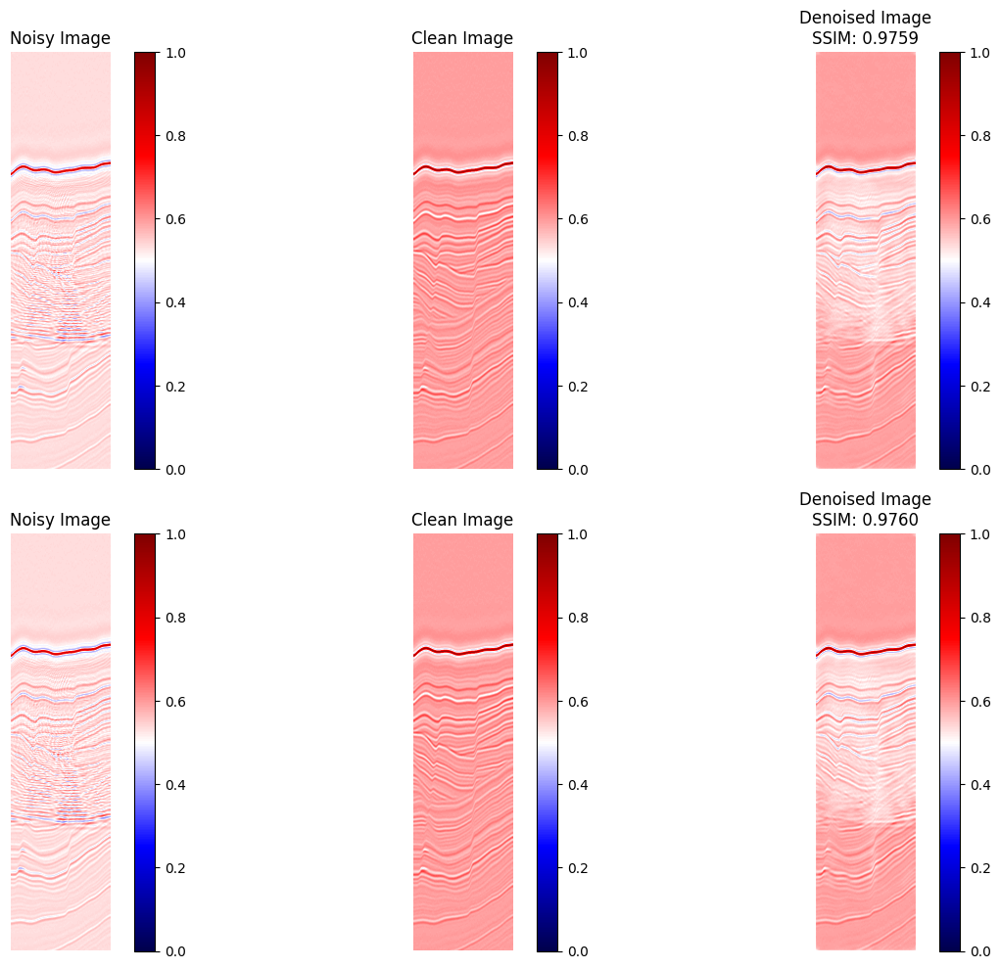

In [15]:
import matplotlib.pyplot as plt
import random

# Set figure size wider for presentations, and tall enough for 2 rows
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
random_indices = random.sample(range(len(noisy_images)), 2)

for idx, rand_idx in enumerate(random_indices):
    ssim_score = test_ssim_scores[rand_idx]
    vmin, vmax = 0, 1

    # Noisy Image
    im1 = axes[idx, 0].imshow(noisy_images[rand_idx], cmap='seismic', vmin=vmin, vmax=vmax)
    axes[idx, 0].set_title("Noisy Image", fontsize=12)
    axes[idx, 0].axis('off')
    fig.colorbar(im1, ax=axes[idx, 0], fraction=0.046, pad=0.04)

    # Clean Image
    im2 = axes[idx, 1].imshow(clean_images[rand_idx], cmap='seismic', vmin=vmin, vmax=vmax)
    axes[idx, 1].set_title("Clean Image", fontsize=12)
    axes[idx, 1].axis('off')
    fig.colorbar(im2, ax=axes[idx, 1], fraction=0.046, pad=0.04)

    # Denoised Image
    im3 = axes[idx, 2].imshow(denoised_images[rand_idx], cmap='seismic', vmin=vmin, vmax=vmax)
    axes[idx, 2].set_title(f"Denoised Image\nSSIM: {ssim_score:.4f}", fontsize=12)
    axes[idx, 2].axis('off')
    fig.colorbar(im3, ax=axes[idx, 2], fraction=0.046, pad=0.04)

# Adjust layout to make everything fit neatly
plt.subplots_adjust(hspace=0.3, wspace=0.1)
plt.tight_layout()
plt.show()


#### Original Data

In [45]:
from obspy.io.segy.segy import _read_segy
import numpy as np

# Load the .sgy seismic section
sgy_path = "/home/bharath/Arindam_dissertation/lineA.sgy"
stream = _read_segy(sgy_path)
data = np.stack([tr.data for tr in stream.traces], axis=1)  # Shape: (time_samples, traces)
print("Original seismic shape:", data.shape)  # Example: (1200, 390)

# Normalize for model input
data = data.astype(np.float32)
data_min, data_max = np.min(data), np.max(data)
data_norm = (data - data_min) / (data_max - data_min)



Original seismic shape: (1001, 390)


In [48]:
# Define model input shape
target_shape = (1259, 300)

# Pad normalized data to match model shape
input_padded = np.zeros(target_shape, dtype=np.float32)
h, w = data_norm.shape
input_padded[:h, :min(w, target_shape[1])] = data_norm[:target_shape[0], :target_shape[1]]

# Reshape for model: (batch_size, height, width, channels)
input_model = np.expand_dims(input_padded, axis=(0, -1))  # Shape: (1, 1259, 300, 1)


In [49]:
from tensorflow.keras.models import load_model

model_path = "seismic_denoising_unet.h5"
autoencoder = load_model(model_path, compile=False)


In [50]:
denoised_output = autoencoder.predict(input_model)  # Shape: (1, 1259, 300, 1)
denoised_output = np.squeeze(denoised_output, axis=(0, -1))  # Shape: (1259, 300)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 358ms/step


In [51]:
# Undo normalization if needed
denoised_rescaled = denoised_output * (data_max - data_min) + data_min


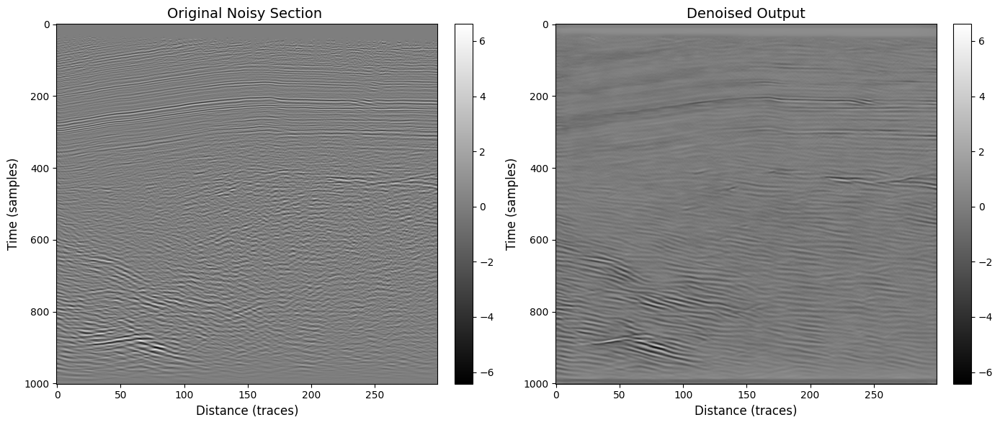

In [58]:
import matplotlib.pyplot as plt
import numpy as np

# Crop to 300 traces (columns)
data_cropped = data[:, :300]
denoised_cropped = denoised_rescaled[:data.shape[0], :300]

# Color scale bounds
vmin = min(np.min(data_cropped), np.min(denoised_cropped))
vmax = max(np.max(data_cropped), np.max(denoised_cropped))

plt.figure(figsize=(14, 6))

# Noisy
plt.subplot(1, 2, 1)
plt.gca().invert_yaxis()
plt.title("Original Noisy Section ", fontsize=14)
im1 = plt.imshow(data_cropped, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.xlabel("Distance (traces)", fontsize=12)
plt.ylabel("Time (samples)", fontsize=12)

plt.colorbar(im1, fraction=0.046, pad=0.04)

# Denoised
plt.subplot(1, 2, 2)
plt.gca().invert_yaxis()
plt.title("Denoised Output", fontsize=14)
im2 = plt.imshow(denoised_cropped, cmap='gray', aspect='auto', vmin=vmin, vmax=vmax)
plt.xlabel("Distance (traces)", fontsize=12)
plt.ylabel("Time (samples)", fontsize=12)

plt.colorbar(im2, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()




/tmp/ipykernel_3494467/2623273844.py:18: UserWarning: Adding colorbar to a different Figure <Figure size 1400x600 with 6 Axes> than <Figure size 640x480 with 2 Axes> which fig.colorbar is called on.
  plt.colorbar(im2, fraction=0.046, pad=0.04)


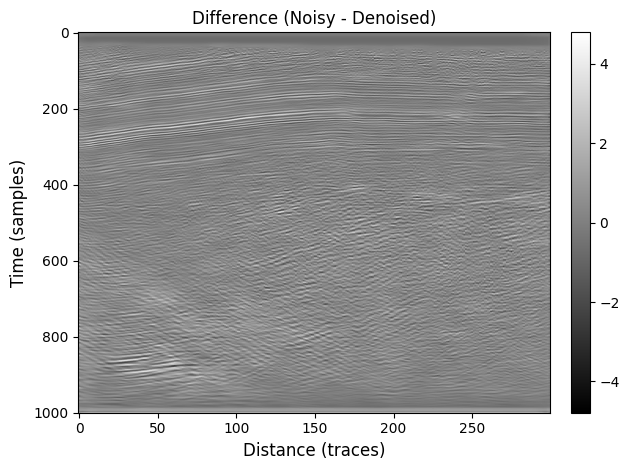

In [60]:
common_height = min(data.shape[0], denoised_rescaled.shape[0])
common_width = min(data.shape[1], denoised_rescaled.shape[1])

data_cropped = data[:common_height, :common_width]
denoised_cropped = denoised_rescaled[:common_height, :common_width]

difference = data_cropped - denoised_cropped
diff_max = np.max(np.abs(difference))
vmin_diff = -diff_max
vmax_diff = diff_max

plt.title("Difference (Noisy - Denoised)")
im = plt.imshow(difference, cmap='gray', aspect='auto', vmin=vmin_diff, vmax=vmax_diff)
plt.colorbar(im, fraction=0.046, pad=0.04)
plt.xlabel("Distance (traces)", fontsize=12)
plt.ylabel("Time (samples)", fontsize=12)

plt.colorbar(im2, fraction=0.046, pad=0.04)

plt.tight_layout()
plt.show()


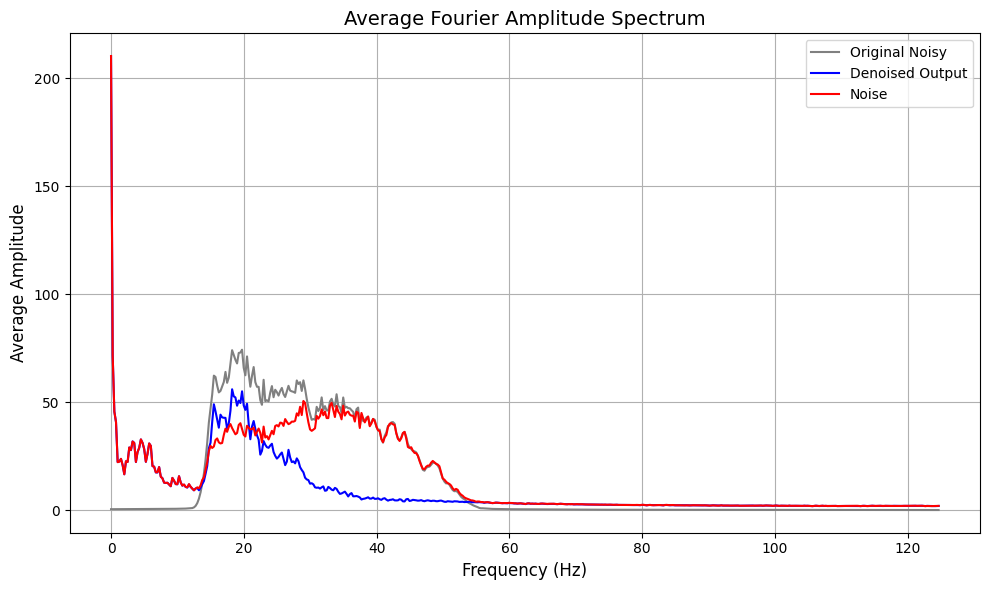

In [63]:
import numpy as np
import matplotlib.pyplot as plt

# Define your sampling interval in seconds (update this if needed!)
dt = 0.004  # 2 milliseconds → 500 Hz sampling frequency
fs = 1 / dt  # Sampling frequency

# Crop data to common shape
common_height = min(data.shape[0], denoised_rescaled.shape[0])
common_width = min(data.shape[1], denoised_rescaled.shape[1])

data_cropped = data[:common_height, :common_width]
denoised_cropped = denoised_rescaled[:common_height, :common_width]
residual = data_cropped - denoised_cropped

# Function to compute average amplitude spectrum
def average_amplitude_spectrum(section, dt):
    fft_vals = np.fft.fft(section, axis=0)
    amplitude = np.abs(fft_vals[:fft_vals.shape[0] // 2])  # Positive frequencies
    avg_amplitude = np.mean(amplitude, axis=1)
    freqs = np.fft.fftfreq(section.shape[0], d=dt)[:section.shape[0] // 2]
    return freqs, avg_amplitude

# Compute amplitude spectra
freqs, amp_noisy = average_amplitude_spectrum(data_cropped, dt)
_, amp_denoised = average_amplitude_spectrum(denoised_cropped, dt)
_, amp_residual = average_amplitude_spectrum(residual, dt)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(freqs, amp_noisy, label="Original Noisy", color='gray')
plt.plot(freqs, amp_denoised, label="Denoised Output", color='blue')
plt.plot(freqs, amp_residual, label="Noise", color='red')
plt.xlabel("Frequency (Hz)", fontsize=12)
plt.ylabel("Average Amplitude", fontsize=12)
plt.title("Average Fourier Amplitude Spectrum", fontsize=14)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()
